# Statistics Inference & Story telling

# 0. Questions of Interest:

    * 1. Which borough in NYC have the highest price? Highest growth rate?
    * 2. Points and wine price: Do higher points results in a higher price? 
    * 3. Variety and wine price: Which grape variety has the highest price on average? Does red wine have a higher price than white wine in general?
    * 4. Winery and wine price: What are the wineries that produce most expensive wine?
    * 5. Year and price: Is it true that aged wines are in general more expensive than non-aged wines?

# 1. Import all the toolboxs for EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import plotly.express as px
import datetime as dt

from tqdm import tqdm_notebook as tqdm
tqdm().pandas()

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import warnings
warnings.simplefilter(action='ignore', category=RuntimeWarning)
# import warnings
# warnings.simplefilter(action='ignore', category=SettingWithCopyWarning)


pd.set_option('display.max_columns', None)

sns.set()


/Users/justin/anaconda3/lib/python3.7/site-packages/tqdm/std.py:648: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version



# 2. Import the non-0 data set for analysis & original data set for count analysis

In [2]:
nyc14 = pd.read_csv('data/NYC/nyc14.csv', index_col=False);
nyc14.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 352938 entries, 0 to 352937
Data columns (total 20 columns):
borough                           352938 non-null int64
neighborhood                      352938 non-null object
building_class_category           352938 non-null object
tax_class_at_present              352938 non-null object
block                             352938 non-null int64
lot                               352938 non-null int64
building_class_at_present         352938 non-null object
address                           352938 non-null object
apartment_number                  352938 non-null object
zip_code                          352938 non-null float64
residential_units                 352938 non-null int64
commercial_units                  352938 non-null int64
total_units                       352938 non-null int64
land_sqft                         352938 non-null float64
gross_sqft                        352938 non-null float64
year_built                        352

# 3. NYC House Price & Time
## 3.1 Normality check
Here going to first check the normality of our target variables(sale_price)

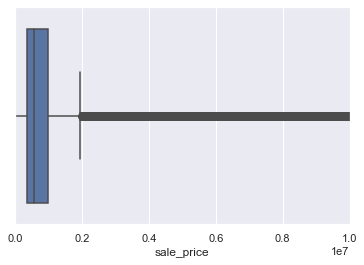

In [3]:
nyc14.sale_price.describe()
price_boxplot = sns.boxplot(nyc14.sale_price)
price_boxplot.set(xlim=(0,10000000));

In [4]:
## Make function for normality test:

def normality_test(x):
    if stats.normaltest(x)[1] < 0.05:
        print('p-value:',stats.normaltest(x)[1]," < 0.05, reject the null hypothesis, this distribution is not nomrmal.")
    else:
        print('p-value:',stats.normaltest(x)[1]," >= 0.05, this is a normal distribution.")


def normality_test_2000(x):
    """ Jarque_bera test only works for data set that have more than 2000 samples"""
    if stats.jarque_bera(x)[1] < 0.05:
        print('p-value:',stats.jarque_bera(x)[1]," < 0.05, reject the null hypothesis, this distribution is not nomrmal.")
    else:
        print('p-value:',stats.jarque_bera(x)[1]," >= 0.05, this is a normal distribution.")

From both the QQ-plot and normality test, we can see that our sales price is not normally distributed. The up bend of the tail of QQ-plot means that our normality plot will have a fatter tail on the right end, which means the distribution is left skewed due to some of the extreme high housing sales price.

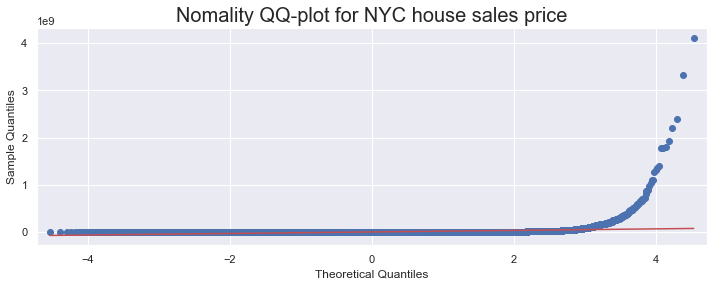

p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is not nomrmal.


In [5]:
from statsmodels.graphics.gofplots import qqplot
sns.set(rc={'figure.figsize':(12,4)})
qqplot(nyc14.sale_price, line='s')
plt.title('Nomality QQ-plot for NYC house sales price', size=20)
plt.show()

normality_test(nyc14.sale_price)

## 3.2 Mean for NYC Daily House Price

In [6]:
nyc14.sale_date= pd.to_datetime(nyc14.sale_date) 

In [7]:
# Group the data by date and their averge house price per day
nyc_ts = nyc14.groupby('sale_date').sale_price.mean().to_frame(name='sale_price_mean').reset_index()
len(nyc_ts)

2035

p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is not nomrmal.


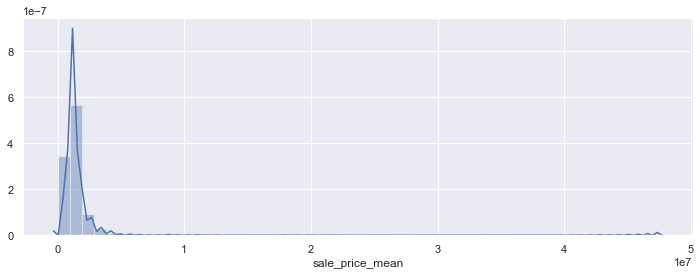

In [8]:
# Normality check for average house price per day 
sns.distplot(nyc_ts.sale_price_mean);
normality_test(nyc_ts.sale_price_mean)

# HOW TO PLOT MONTHLY TIME SERIES

In [9]:
px.line(nyc_ts, "sale_date", "sale_price_mean", title='2013 - 2018 NYC Daily Average House Price')

## 3.3 NYC yearly house price

Originally used the dataset that filter out all the 0 data, and then realized that 2018 have the extreme high sales counts, after some check, I realized that by dropping all the row with any 0,the data is not balanced, so I have decided to use the original dataset which nothing is dropped.

Since house market sales plunge in 2018, going to plot out and see if the low demand is reflected on the avg house price. Now, we are going to use the NYC14 dataframe, which all the price=0 rows are dropped, to not let the 0 to affect the avg and median house price.

/Users/justin/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (6,11,12,13) have mixed types. Specify dtype option on import or set low_memory=False.



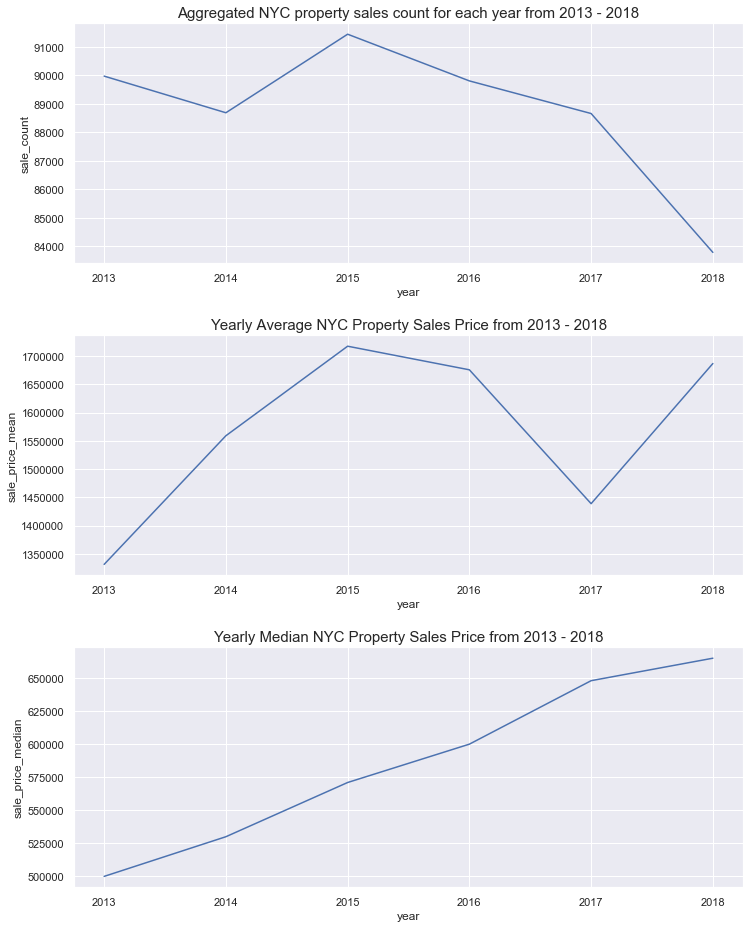

In [10]:
nyc2 = pd.read_csv('data/NYC/nyc1.csv', index_col=False)
nyc2['month'] = pd.DatetimeIndex(nyc2['sale_date']).month
nyc2['year'] = pd.DatetimeIndex(nyc2['sale_date']).year

plt.subplots_adjust(left=None, bottom=0, right=None, top=3, wspace=None, hspace=0.3)

plt.subplot(3,1,1)
nyc_ts_year_count_no_zero = nyc2.groupby('year').size().to_frame(name='sale_count').reset_index()
sns.lineplot(nyc_ts_year_count_no_zero.year, nyc_ts_year_count_no_zero.sale_count);
plt.title('Aggregated NYC property sales count for each year from 2013 - 2018', size=15);

nyc14['month'] = pd.DatetimeIndex(nyc14['sale_date']).month
nyc14['year'] = pd.DatetimeIndex(nyc14['sale_date']).year

plt.subplot(3,1,2)
nyc_ts_price_year_avg = nyc14.groupby('year').sale_price.mean().to_frame(name='sale_price_mean').reset_index()
# pd.set_option('display.max_rows', None)
sns.lineplot(nyc_ts_price_year_avg.year, nyc_ts_price_year_avg.sale_price_mean);
plt.title('Yearly Average NYC Property Sales Price from 2013 - 2018', size=15);

plt.subplot(3,1,3)
nyc_ts_price_year_mid = nyc14.groupby('year').sale_price.median().to_frame(name='sale_price_median').reset_index()
# pd.set_option('display.max_rows', None)
sns.lineplot(nyc_ts_price_year_mid.year, nyc_ts_price_year_mid.sale_price_median);
plt.title('Yearly Median NYC Property Sales Price from 2013 - 2018', size=15);


From the plots above, we can see that the median and aaverage plot show totally different trend, to decide which one to use, I have to first check that if house price from every year is skewed by applying skewness teat.

In [11]:
nyc_2013 = nyc14[nyc14.year==2013]
nyc_2014 = nyc14[nyc14.year==2014]
nyc_2015 = nyc14[nyc14.year==2015]
nyc_2016 = nyc14[nyc14.year==2016]
nyc_2017 = nyc14[nyc14.year==2017]
nyc_2018 = nyc14[nyc14.year==2018]

In [12]:
# Tests whether the skew is different from the normal distribution.
# This function tests the null hypothesis that the skewness of the population that the sample
# was drawn from is the same as that of a corresponding normal distribution.

def skewtest(data):
    if stats.skewtest(data)[1] < 0.05:
        print('p-value:',stats.skewtest(data)[1]," < 0.05, reject the null hypothesis, this distribution is skewed.")
    else:
        print('p-value:',stats.skewtest(data)[1]," >= 0.05, this distribution is not skewed.")

Since each year's distribution of sale_price is skewed, median will be a better measure than average here.

In [13]:
skewtest(nyc_2013.sale_price)
skewtest(nyc_2014.sale_price)
skewtest(nyc_2015.sale_price)
skewtest(nyc_2016.sale_price)
skewtest(nyc_2017.sale_price)
skewtest(nyc_2018.sale_price)

p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.


Here going to write a funtion to calculate the annual growth rate of sales count and median price, and plot it out to see if there exist correlation. When first plot out, realized that the two annual growth rate exist a really big differnet for the first firgure, then realized that for the function range shall start at 1 instead of 0, because if it start with the 0 row, it will automatically use zero for iloc[i-1] and make a big mistake.

In [14]:
nyc_year_sales_count_growth = []

for i in range(1, len(nyc_ts_year_count_no_zero.sale_count)):
    x = ((nyc_ts_year_count_no_zero.sale_count.iloc[i] - nyc_ts_year_count_no_zero.sale_count.iloc[i-1])/nyc_ts_year_count_no_zero.sale_count.iloc[i-1])
    nyc_year_sales_count_growth.append(x)

In [15]:
nyc_year_mid_price_growth = []

for i in range(1, len(nyc_ts_price_year_mid.year)):
    x = ((nyc_ts_price_year_mid.sale_price_median.iloc[i] - nyc_ts_price_year_mid.sale_price_median.iloc[i-1])/nyc_ts_price_year_mid.sale_price_median.iloc[i-1])
    nyc_year_mid_price_growth.append(x)

A interest finding here is that except the annual growth rate of sales count and median price seems to follow very simliar trend.

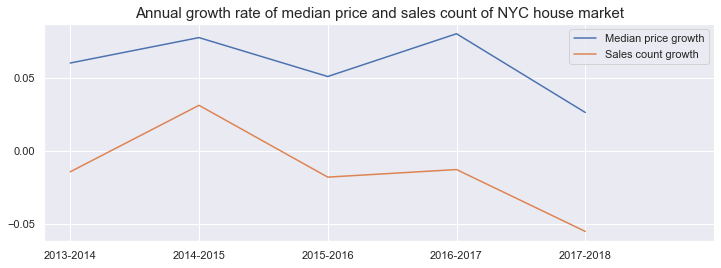

In [16]:
plt.plot(nyc_year_mid_price_growth, label="Median price growth")
plt.plot(nyc_year_sales_count_growth, label='Sales count growth')
plt.legend()
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of NYC house market", size=15);
plt.show()

In [17]:
stop here

SyntaxError: invalid syntax (<ipython-input-17-a96ba3aab008>, line 1)

# After figure out monthly rate, put in immigration for years and then currency for month to see if there is certian affect

## 3.4 NYC monthly house price

### 3.4.1 NYC monthly house prcie(continuous)

# WHY CAN'T THE FUNCTION WORK!!!!

In [ ]:
## nyc2.sales_count_monthly continuous

In [ ]:
## nyc14.sales_price_monthly continuous

In [ ]:
asdxfghjkl

In [ ]:
nyc14['month'] = pd.DatetimeIndex(nyc14['sale_date']).month
nyc14['year'] = pd.DatetimeIndex(nyc14['sale_date']).year
nyc14['year_month'] = nyc14['sale_date'].dt.to_period('M')

nyc14.year_month

use xticks method!!

# nyc14['year_month1'] = nyc14['sale_date'].map(lambda x: 100*x.year + x.month)

In [ ]:
nyc15 = nyc14.year_month.to_timestamp(freq="M")

In [ ]:

# nyc14['year_month'] = nyc14['sale_date'].dt.to_period('M')

# nyc14.year_month

nyc_ts_month_year_avg = nyc14.groupby(['year','month']).sale_price.median().to_frame(name='median_sale_price').reset_index()


# groups = series.groupby(Grouper(freq='A'))

# HOW TO PLOT MONTHLY SERIES??
## how bout seperarte differnet years month sales count and see if there is a pattern 

# def draw_logins(window, time_interval):
#     '''
#     Draw login counts based on a given time interval and time window
#     '''
#     logins[window].set_index('login_time').resample(time_interval).count().plot(figsize=(18, 4))
#     plt.xlabel('Login times ('+time_interval+' intervals)')
#     plt.ylabel('Loging counts')
#     plt.show()

In [ ]:
plt.plot(nyc_ts_month_year_avg.month, nyc_ts_month_year_avg.median_sale_price)

In [ ]:
px.lineplot(nyc_ts_month_year_avg, )

### 3.4.2 NYC monthly house prcie(aggregate)

First checking the house price distribution for each month, and relaized that since the data is skewed, median will be a better measurement here.

In [18]:
nyc_jan = nyc14[nyc14.month==1]
nyc_feb = nyc14[nyc14.month==2]
nyc_mar = nyc14[nyc14.month==3]
nyc_apr = nyc14[nyc14.month==4]
nyc_may = nyc14[nyc14.month==5]
nyc_jun = nyc14[nyc14.month==6]
nyc_jul = nyc14[nyc14.month==7]
nyc_aug = nyc14[nyc14.month==8]
nyc_sep = nyc14[nyc14.month==9]
nyc_oct = nyc14[nyc14.month==10]
nyc_nov = nyc14[nyc14.month==11]
nyc_dec = nyc14[nyc14.month==12]

In [19]:
# skewtest(nyc_jan.sale_price)
# skewtest(nyc_feb.sale_price)
# skewtest(nyc_mar.sale_price)
# skewtest(nyc_apr.sale_price)
# skewtest(nyc_may.sale_price)
# skewtest(nyc_jun.sale_price)
# skewtest(nyc_jul.sale_price)
# skewtest(nyc_aug.sale_price)
# skewtest(nyc_sep.sale_price)
# skewtest(nyc_oct.sale_price)
# skewtest(nyc_nov.sale_price)
# skewtest(nyc_dec.sale_price)

Since house market is hot in June, July, August, going to plot out and see if the high demend will have affect on avg house price every month. Now, we are going to use the NYC14 dataframe, which all the price=0 rows are dropped, to not let the 0 to affect the median house price.

The NYC median house price seems to have similiar trend with sale count for each month, since this data is not continuous, it is pointless to count the growth rate between each month.

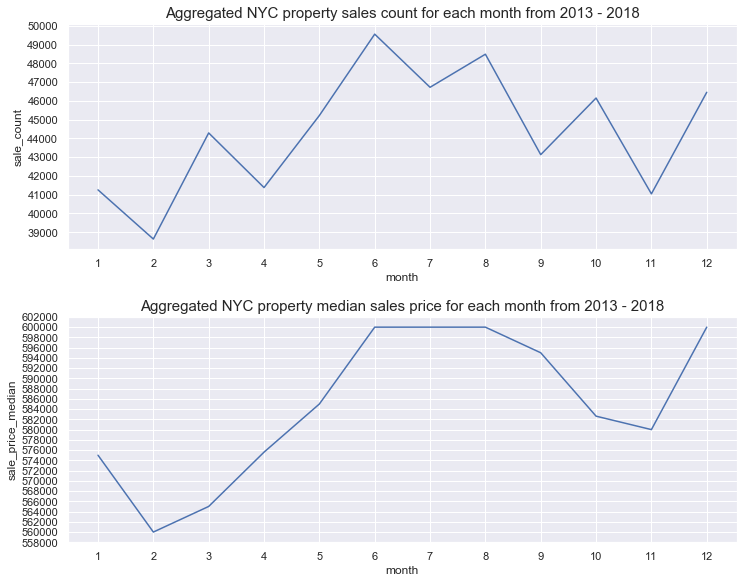

In [20]:
plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.3)

plt.subplot(2,1,1)
nyc_ts_month_count_no_zero = nyc2.groupby('month').size().to_frame(name='sale_count').reset_index()
# pd.set_option('display.max_rows', None)

sns.lineplot(nyc_ts_month_count_no_zero.month, nyc_ts_month_count_no_zero.sale_count);
plt.title('Aggregated NYC property sales count for each month from 2013 - 2018', size=15);
plt.locator_params(nbins=24)

plt.subplot(2,1,2)
nyc_ts_price_month_mid = nyc14.groupby('month').sale_price.median().to_frame(name='sale_price_median').reset_index()

# pd.set_option('display.max_rows', None)
sns.lineplot(nyc_ts_price_month_mid.month, nyc_ts_price_month_mid.sale_price_median);
plt.locator_params(nbins=24);
plt.title('Aggregated NYC property median sales price for each month from 2013 - 2018', size=15);

# 4. Borough and house price:

## 4.0 NYC and summary

In [21]:
# Going to first seperate the data into boroughs(for counts)

man_c = nyc2[nyc2.borough==1]
bx_c = nyc2[nyc2.borough==2]
bk_c = nyc2[nyc2.borough==3]
qns_c = nyc2[nyc2.borough==4]
stn_c = nyc2[nyc2.borough==5]

In [22]:
# For price

man = nyc14[nyc14.borough==1]
bx = nyc14[nyc14.borough==2]
bk = nyc14[nyc14.borough==3]
qns = nyc14[nyc14.borough==4]
stn = nyc14[nyc14.borough==5]
boroughs={1:'MAN', 2:'BX', 3:'BK', 4:'QNS', 5:'STN'}

In [23]:
nyc14['borough_name'] = nyc14['borough'].map(boroughs)

In [24]:
skewtest(man.sale_price)
skewtest(bx.sale_price)
skewtest(bk.sale_price)
skewtest(qns.sale_price)
skewtest(stn.sale_price)

p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is skewed.


In [25]:
## Mann-Whitney u Ufor each area in manhattan

In [26]:
def hypo_1side(x, y):
    """H0: Manhattan house price is >= Brooklyn house price
         H1: Manhattan house price is < Brooklyn house price"""
    if (stats.mannwhitneyu(x, y, alternative='less')[1]) >= 0.05:
        return "P-value: " + str('{:f}'.format(stats.mannwhitneyu(x, y, alternative='less')[1])) + ', x' + ' house price is higher than '+ 'y'
    else:
        return "P-value: " + str('{:f}'.format(stats.mannwhitneyu(x, y, alternative='less')[1])) + ', y' + ' houes price is higher than '+ 'x'

def hypo_2sides(x, y):
    """H0: Manhattan house price is == Brooklyn house price
         H1: Manhattan house price is =! Brooklyn house price"""
    if (stats.mannwhitneyu(x, y, alternative='less')[1]) >= 0.05:
        return "P-value: " + str('{:f}'.format(stats.mannwhitneyu(x, y, alternative='two-sided')[1])) + ', x' + ' house price is equal to ' + 'y'
    else:
        return "P-value: " + str('{:f}'.format(stats.mannwhitneyu(x, y, alternative='two-sided')[1])) + ', x' + ' houes price is not equal to ' + 'y'
    


In [27]:
print(hypo_1side(man.sale_price, bk.sale_price))
print(hypo_1side(bk.sale_price, qns.sale_price))
print(hypo_1side(qns.sale_price, stn.sale_price))
print(hypo_1side(stn.sale_price, bx.sale_price))

P-value: 1.000000, x house price is higher than y
P-value: 1.000000, x house price is higher than y
P-value: 1.000000, x house price is higher than y
P-value: 1.000000, x house price is higher than y


No surprise that Manhattan have the highest median price followed by Brooklyn, Queens, Staten Island then Bronx. To dig into more such as the growth rate, and each neighborhood, going to start the analysis by looking at each borough seperately.

In [28]:
nyc_borough_year_median = nyc14.groupby(['year', 'borough_name']).sale_price.median().to_frame(name='annual_borough_median_price').reset_index()
nyc_borough_year_median_plot = px.line(nyc_borough_year_median, 'year', 'annual_borough_median_price', color='borough_name', title='Yearly Median House Price for each Boroughs in NYC', height=500, width=750);
nyc_borough_year_median_plot

In [29]:
nyc2['borough_name'] = nyc2['borough'].map(boroughs)

In [30]:
nyc_borough_year_count_no_zero = nyc2.groupby(['year', 'borough_name']).sale_price.count().to_frame(name='sale_count').reset_index()
px.line(nyc_borough_year_count_no_zero, 'year', 'sale_count', color='borough_name', height=400, title='Annual Total Sales Count in each borough in NYC ')

In [31]:
nyc_borough_year_median_sort = nyc_borough_year_median.sort_values(['borough_name','year']).reset_index(drop=True)
# nyc_borough_year_median_sort

In [32]:
nyc_median_boroughs_growth_rate = []

for i in range(0,len(nyc_borough_year_median_sort)):
    if nyc_borough_year_median_sort.borough_name.iloc[i] == nyc_borough_year_median_sort.borough_name.iloc[i-1]:
        nyc_median_boroughs_growth_rate.append((nyc_borough_year_median_sort.annual_borough_median_price.iloc[i]\
                                              - nyc_borough_year_median_sort.annual_borough_median_price.iloc[i-1])\
                                              / nyc_borough_year_median_sort.annual_borough_median_price.iloc[i-1])
    else:
        nyc_median_boroughs_growth_rate.append(0)





In [33]:
nyc_borough_year_median_sort['nyc_boroughs_annual_median_house_price_growth_rate'] = nyc_median_boroughs_growth_rate
# nyc_borough_year_median_sort

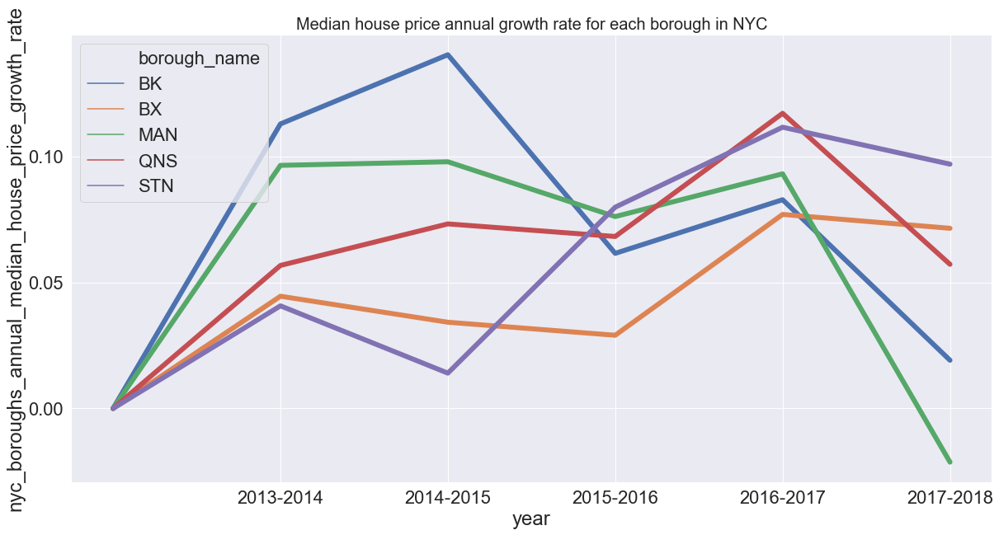

In [50]:
fig = plt.gcf();
fig.set_size_inches(20, 10);

sns.lineplot(nyc_borough_year_median_sort.year, nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate, hue=nyc_borough_year_median_sort.borough_name, linewidth=6)
plt.locator_params(nbins=5);
plt.xticks([2014,2015,2016,2017,2018],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018']);
plt.title('Median house price annual growth rate for each borough in NYC', size=20);

In [53]:
nyc_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(nyc_borough_year_median_sort))):
    if nyc_borough_year_median_sort['borough_name'].iloc[i] != nyc_borough_year_median_sort['borough_name'].iloc[i-1]:
        nyc_neighborhood_median_growth_rate_avg.append((nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate.iloc[i]\
                                                    + nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate.iloc[i+1]\
                                                   + nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate.iloc[i+2]\
                                                   + nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate.iloc[i+3]\
                                                   + nyc_borough_year_median_sort.nyc_boroughs_annual_median_house_price_growth_rate.iloc[i+4])\
                                                   /5)
    else:
        nyc_neighborhood_median_growth_rate_avg.append(0)
        
nyc_borough_year_median_sort['median_growth_rate_avg'] = nyc_neighborhood_median_growth_rate_avg


In [56]:
nyc_borough_year_median_growth_rank = nyc_borough_year_median_sort[nyc_borough_year_median_sort.median_growth_rate_avg != 0]
nyc_borough_year_median_growth_rank

,year,borough_name,annual_borough_median_price,nyc_boroughs_annual_median_house_price_growth_rate,median_growth_rate_avg
0,2013,BK,538277.5,0.0,0.079459
6,2013,BX,350860.0,0.0,0.036926
12,2013,MAN,830000.0,0.0,0.072657
18,2013,QNS,388000.0,0.0,0.063015
24,2013,STN,380000.0,0.0,0.049199


In [57]:
nyc_borough_year_median_growth_ranking = nyc_borough_year_median_growth_rank.drop(['year','annual_borough_median_price','nyc_boroughs_annual_median_house_price_growth_rate'], axis=1).sort_values('median_growth_rate_avg', ascending=False).reset_index(drop=True)


From the table below we can see that between year 2013 - 2018, Brooklyn's median house price have the highest average annual growth rate, followed by Queens, Staten Island, Manhattan then Bronx.

In [58]:
nyc_borough_year_median_growth_ranking

,borough_name,median_growth_rate_avg
0,BK,0.079459
1,MAN,0.072657
2,QNS,0.063015
3,STN,0.049199
4,BX,0.036926


## 4.1 Manhattan:

### 4.1.1 Manhattan sales price and market demand:

From the trend of yearly median sales price and the trend of annual sale count, house market in Manhattan do not show a strong correlation between this two variable, though the growth rate seems to have a more similiar pattern, but is till not enough for us to asset that this two variables exist any correlation.

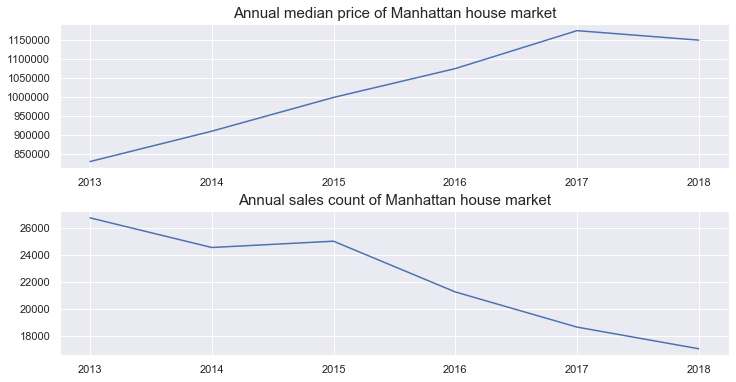

In [37]:
man_year_price_median = man.groupby('year').sale_price.median().to_frame(name='man_median_price').reset_index()
man_year_count_no_zero = man_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.3)



plt.subplot(3,1,1)
plt.plot(man_year_price_median.man_median_price, label="Manhattan median price")
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);


plt.title("Annual median price of Manhattan house market", size=15);

plt.subplot(3,1,2)
plt.plot(man_year_count_no_zero.sale_count, label='Manhattan sales count')
plt.title("Annual sales count of Manhattan house market", size=15);
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);

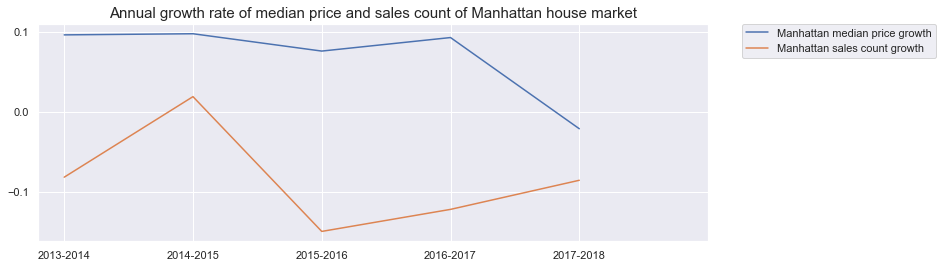

In [38]:
man_year_sales_count_growth = []

for i in range(1, len(man_year_count_no_zero.sale_count)):
    x = ((man_year_count_no_zero.sale_count.iloc[i] - man_year_count_no_zero.sale_count.iloc[i-1])/man_year_count_no_zero.sale_count.iloc[i-1])
    man_year_sales_count_growth.append(x)
    
    
    
man_year_mid_price_growth = []

for i in range(1, len(man_year_price_median.year)):
    x = ((man_year_price_median.man_median_price.iloc[i] - man_year_price_median.man_median_price.iloc[i-1])/man_year_price_median.man_median_price.iloc[i-1])
    man_year_mid_price_growth.append(x)

plt.plot(man_year_mid_price_growth, label="Manhattan median price growth")
plt.plot(man_year_sales_count_growth, label='Manhattan sales count growth')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Manhattan house market", size=15);
plt.show()

### 4.1.2 Manhattan property sales price and neighborhood:

When calculating the average annual growth rate for each neighborhood, I realzied that there are 5 rows with neighborhood: manhattan_unknown. Originally going to use zip_code to fill these unknowns but after checking realized that some neighborhood belongs to the same zip_code so going to drop them.

In [39]:
# nyc14[nyc14.zip_code == 10027].head()
man_neighborhood_clean = man[man.neighborhood!='manhattan_unknown']
# len(man)
# len(man_neighborhood_clean)

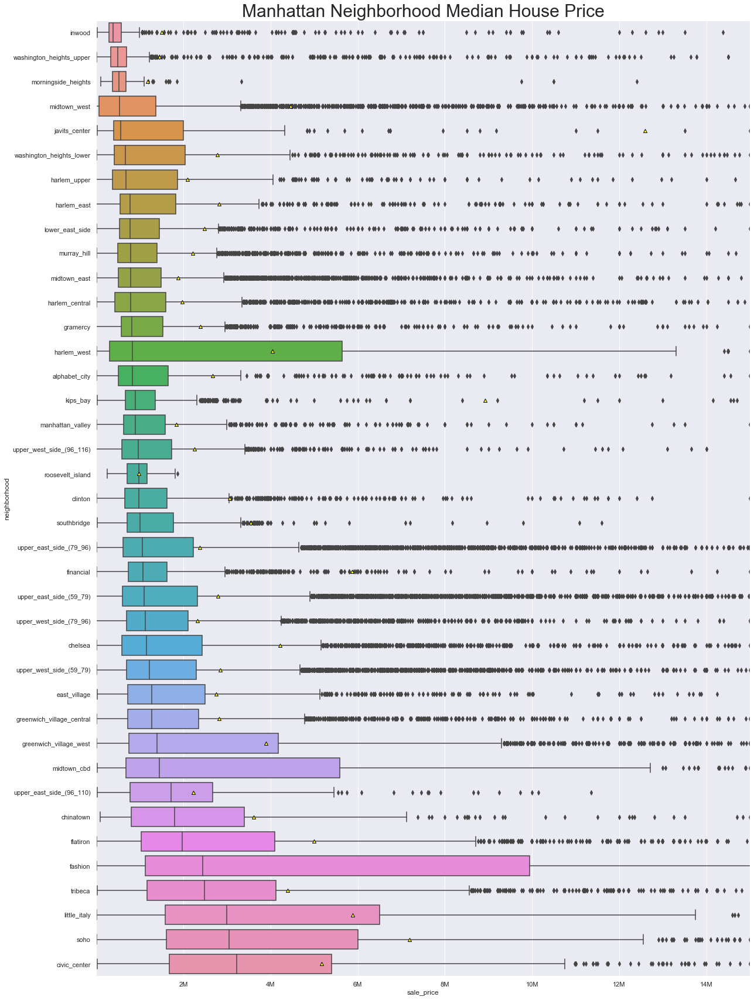

In [40]:
man_neighborhood_median_sort = man_neighborhood_clean.groupby(['neighborhood']).median().sort_values('sale_price', ascending=True)

fig = plt.gcf();
fig.set_size_inches(20, 30);

man_neighborhood_median_sort_boxplot = sns.boxplot(man_neighborhood_clean.sale_price, man_neighborhood_clean.neighborhood, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=man_neighborhood_median_sort.index.tolist());
man_neighborhood_median_sort_boxplot.set(xlim=(0, 15000000));
sns.set(font_scale = 2)
plt.xticks([2000000, 4000000, 6000000, 8000000, 10000000, 12000000, 14000000],['2M','4M','6M','8M','10M','12M','14M'])
plt.title("Manhattan Neighborhood Median House Price", size=30);

# WHY CAN'T THE FUNCTION WORK!!!!

In [41]:
man_neighborhood = man.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()
man_neighborhood

# If i am trying to adda new column using function, 
# it will not work so I need to keep just the function, and add it to the list then append

def neighborhood_median_growth_rate(df):
    for i in tqdm(range(0, len(df))):
        if df['neighborhood'].iloc[i] == df['neighborhood'].iloc[i-1]:
            df['neighborhood_median_growth_rate'] == ((df.sale_price_median.iloc[i] - df.sale_price_median.iloc[i-1])/df.sale_price_median.iloc[i-1])
        else:
            df['neighborhood_median_growth_rate'] == 0
    return df['neighborhood_median_growth_rate']

In [42]:
# neighborhood_median_growth_rate(man_neighborhood)

In [43]:
man_neighborhood = man_neighborhood_clean.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()

man_neighborhood_median_growth_rate = []

for i in tqdm(range(0, len(man_neighborhood))):
    if man_neighborhood['neighborhood'].iloc[i] == man_neighborhood['neighborhood'].iloc[i-1]:
        man_neighborhood_median_growth_rate.append((man_neighborhood.sale_price_median.iloc[i] - man_neighborhood.sale_price_median.iloc[i-1])/man_neighborhood.sale_price_median.iloc[i-1])
    else:
        man_neighborhood_median_growth_rate.append(0)
        
man_neighborhood['median_growth_rate'] = man_neighborhood_median_growth_rate

To calculate the average annual median price growth rate, realized a problem here that neighborhood:manhattan_unknown only have 3 years, neighborhood:roosevelt_island only have 2 years, will have problem with code, going to drop them first.

In [44]:
# man_neighborhood.neighborhood.value_counts()
man_neighborhood_c = man_neighborhood[man_neighborhood.neighborhood!='roosevelt_island']

In [45]:

man_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(man_neighborhood_c))):
    if man_neighborhood_c['neighborhood'].iloc[i] != man_neighborhood_c['neighborhood'].iloc[i-1]:
        man_neighborhood_median_growth_rate_avg.append((man_neighborhood_c.median_growth_rate.iloc[i+1]\
                                                    + man_neighborhood_c.median_growth_rate.iloc[i+2]\
                                                   + man_neighborhood_c.median_growth_rate.iloc[i+3]\
                                                   + man_neighborhood_c.median_growth_rate.iloc[i+4]\
                                                   + man_neighborhood_c.median_growth_rate.iloc[i+5])\
                                                   /5)
    else:
        man_neighborhood_median_growth_rate_avg.append(0)
        
man_neighborhood_c['median_growth_rate_avg'] = man_neighborhood_median_growth_rate_avg

/Users/justin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Since roosevelt_island only have data from 2017 to 2018, so not going to include it for ranking comparison.

In [46]:
# man_neighborhood_c

In [47]:
man_median_avg_growth_rate_extract = man_neighborhood_c[man_neighborhood_c.median_growth_rate_avg!=0]

In [48]:
man_median_avg_growth_rate_ranking = man_median_avg_growth_rate_extract.drop(['year','sale_price_median','median_growth_rate'], axis=1).set_index('neighborhood').median_growth_rate_avg.sort_values(ascending=False)
man_median_avg_growth_rate_ranking

neighborhood
midtown_west                 1.141422
midtown_cbd                  0.341483
lower_east_side              0.165223
civic_center                 0.149967
little_italy                 0.134494
east_village                 0.124090
greenwich_village_west       0.115136
harlem_west                  0.114528
harlem_central               0.107419
morningside_heights          0.102454
flatiron                     0.090285
greenwich_village_central    0.087445
washington_heights_upper     0.079361
gramercy                     0.076555
fashion                      0.076307
chinatown                    0.071865
upper_east_side_(79_96)      0.069263
upper_west_side_(79_96)      0.067495
clinton                      0.062630
inwood                       0.060263
kips_bay                     0.059040
upper_west_side_(59_79)      0.055660
manhattan_valley             0.054938
tribeca                      0.054903
upper_east_side_(59_79)      0.054540
chelsea                      0.050790

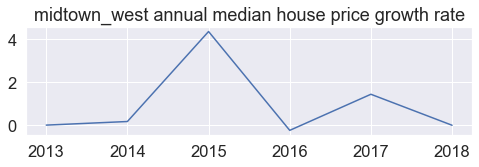

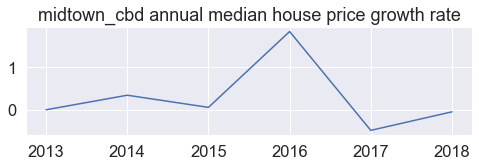

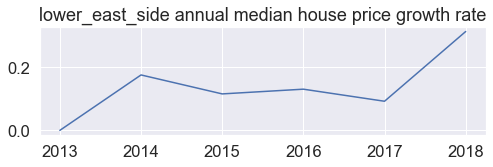

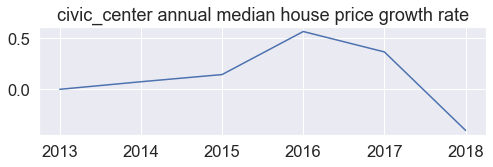

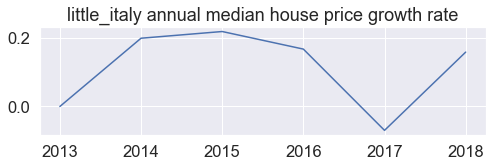

...

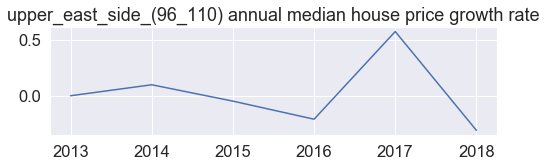

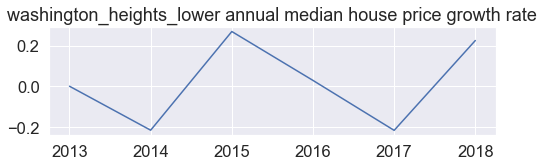

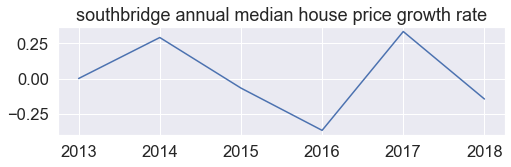

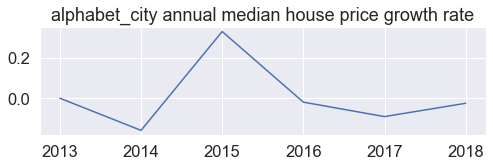

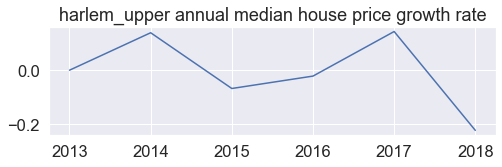

In [60]:
for i in man_median_avg_growth_rate_ranking.index:
    sns.set(font_scale = 1.5)
    fig = plt.gcf()
    fig.set_size_inches(8, 2)
    plt.title(i + ' annual median house price growth rate')
    plt.plot(man_neighborhood_c[man_neighborhood_c.neighborhood==i].year, man_neighborhood_c[man_neighborhood_c.neighborhood==i].median_growth_rate)
    plt.show()
       

## 4.2 Brooklyn:

### 4.2.1 Brooklyn property sales price and market demand:

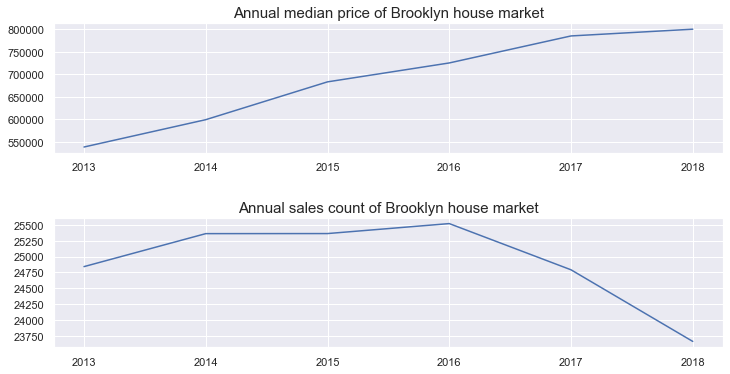

In [61]:
bk_year_price_median = bk.groupby('year').sale_price.median().to_frame(name='bk_median_price').reset_index()
bk_year_count_no_zero = bk_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.5)

sns.set(font_scale = 1)

plt.subplot(3,1,1)
plt.plot(bk_year_price_median.bk_median_price, label="Brooklyn median price")
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);


plt.title("Annual median price of Brooklyn house market", size=15);

plt.subplot(3,1,2)
plt.plot(bk_year_count_no_zero.sale_count, label='Brooklyn sales count')
plt.title("Annual sales count of Brooklyn house market", size=15);
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);

From the first plot below, I realized that there exist correlation between Brooklyn's sales count and Brooklyn's house price, but the trend of the growth of median house price in Brooklyn seeme to react to the sales count growth a year later, after plotting the lagged median house price growth plot, they seems to follow the same trend.

For later prediction, we can check the test set to see if the 2018 - 2019 median house price for Brooklyn match the growth rate of sales count in 2017 - 2018.

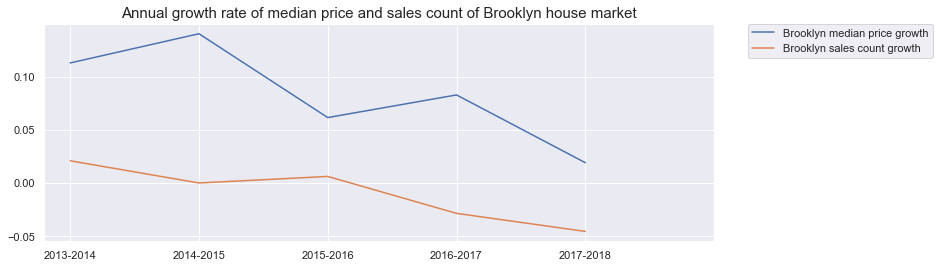

In [62]:
bk_year_sales_count_growth = []

for i in range(1, len(bk_year_count_no_zero.sale_count)):
    x = ((bk_year_count_no_zero.sale_count.iloc[i] - bk_year_count_no_zero.sale_count.iloc[i-1])/bk_year_count_no_zero.sale_count.iloc[i-1])
    bk_year_sales_count_growth.append(x)
    
    
    
bk_year_mid_price_growth = []

for i in range(1, len(bk_year_price_median.year)):
    x = ((bk_year_price_median.bk_median_price.iloc[i] - bk_year_price_median.bk_median_price.iloc[i-1])/bk_year_price_median.bk_median_price.iloc[i-1])
    bk_year_mid_price_growth.append(x)

plt.plot(bk_year_mid_price_growth, label="Brooklyn median price growth")
plt.plot(bk_year_sales_count_growth, label='Brooklyn sales count growth')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Brooklyn house market", size=15);
plt.show()

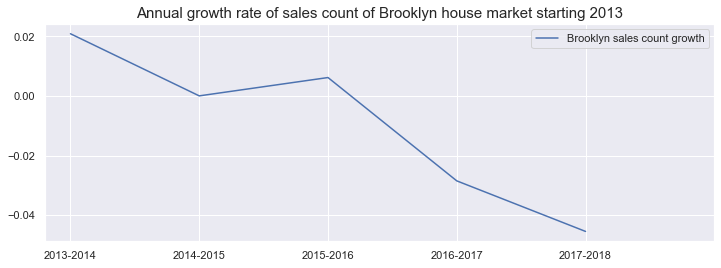

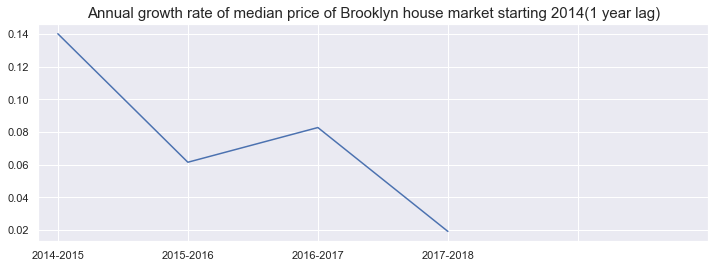

In [63]:
bk_year_sales_count_growth = []

for i in range(1, len(bk_year_count_no_zero.sale_count)):
    x = ((bk_year_count_no_zero.sale_count.iloc[i] - bk_year_count_no_zero.sale_count.iloc[i-1])/bk_year_count_no_zero.sale_count.iloc[i-1])
    bk_year_sales_count_growth.append(x)
    
    

    
bk_year_mid_price_growth = []

for i in range(2, len(bk_year_price_median.year)):
    x = ((bk_year_price_median.bk_median_price.iloc[i] - bk_year_price_median.bk_median_price.iloc[i-1])/bk_year_price_median.bk_median_price.iloc[i-1])
    bk_year_mid_price_growth.append(x)

plt.plot(bk_year_sales_count_growth, label='Brooklyn sales count growth')

plt.legend()
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of sales count of Brooklyn house market starting 2013", size=15);


plt.show()
    
plt.plot(bk_year_mid_price_growth, label="Brooklyn median price growth")
plt.xticks([0,1,2,3,4,5],['2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price of Brooklyn house market starting 2014(1 year lag)", size=15);


plt.show()




### 4.2.2 Brooklyn property sales price and neighborhood:
First glance at the graph, I realized that there exist an abonormal high median price neighborhood -- Jamaica Bay, after looking into the neighborhood, the high median price is caused by the lack of sales in that neighborhoood, and since it's 2 high price transaction are a 22 store building, it is not surprise that the median price of Jamaica Bay is abnormally high.

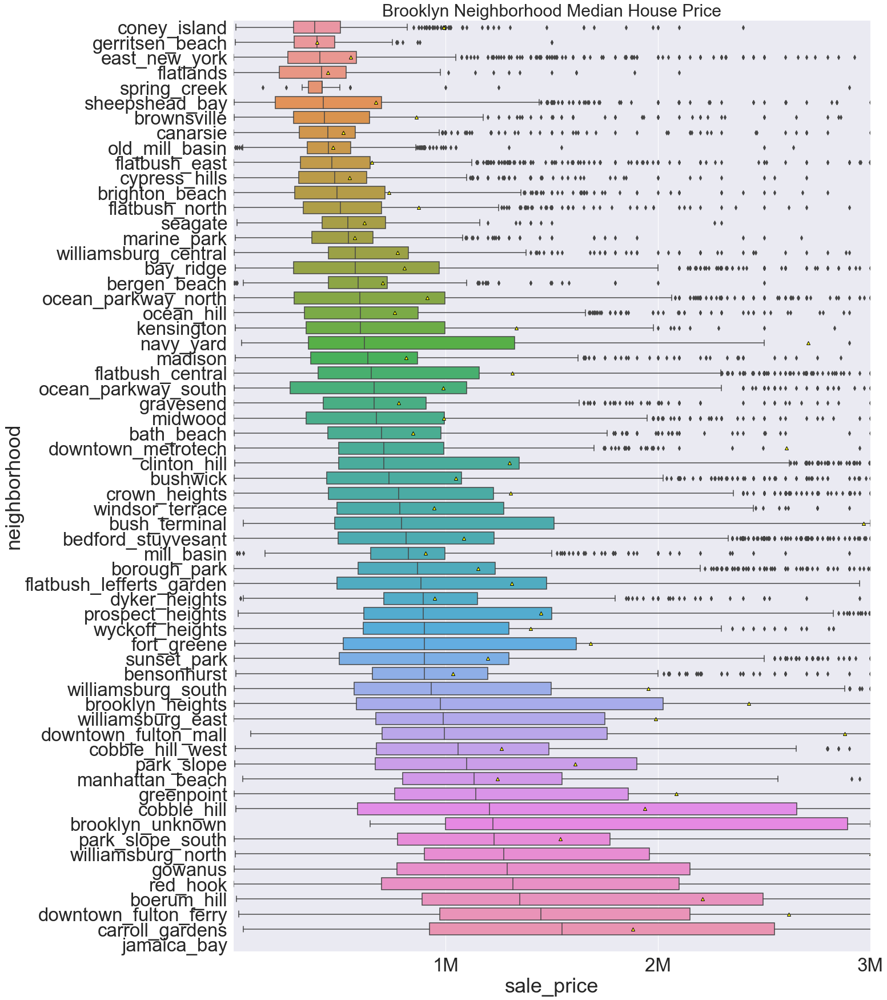

In [64]:
bk_neighborhood_median_sort = bk.groupby(['neighborhood']).median().sort_values('sale_price', ascending=True)

fig = plt.gcf();
fig.set_size_inches(20, 30);
sns.set(font_scale = 3)


bk_neighborhood_median_sort_boxplot = sns.boxplot(bk.sale_price, bk.neighborhood, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=bk_neighborhood_median_sort.index.tolist());
bk_neighborhood_median_sort_boxplot.set(xlim=(0, 3000000));
plt.xticks([1000000, 2000000, 3000000],['1M', '2M','3M'])
plt.title("Brooklyn Neighborhood Median House Price", size=30);

Since the following neigbhborhood only have sales in certain year, will need to drop them for further annual growth analysis.

In [65]:
# bk[bk.neighborhood == 'jamaica_bay']

In [66]:
# bk[bk.neighborhood == 'brooklyn_unknown']

In [67]:
# bk[bk.neighborhood == 'spring_creek']

In [68]:
bk_neighborhood_clean = bk[(bk.neighborhood!='brooklyn_unknown') & (bk.neighborhood!='jamaica_bay') & (bk.neighborhood!='spring_creek')]



In [69]:
bk_neighborhood = bk_neighborhood_clean.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()

bk_neighborhood_median_growth_rate = []

for i in tqdm(range(0, len(bk_neighborhood))):
    if bk_neighborhood['neighborhood'].iloc[i] == bk_neighborhood['neighborhood'].iloc[i-1]:
        bk_neighborhood_median_growth_rate.append((bk_neighborhood.sale_price_median.iloc[i] - bk_neighborhood.sale_price_median.iloc[i-1])/bk_neighborhood.sale_price_median.iloc[i-1])
    else:
        bk_neighborhood_median_growth_rate.append(0)
        
bk_neighborhood['median_growth_rate'] = bk_neighborhood_median_growth_rate

In [70]:
bk_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(bk_neighborhood))):
    if bk_neighborhood['neighborhood'].iloc[i] != bk_neighborhood['neighborhood'].iloc[i-1]:
        bk_neighborhood_median_growth_rate_avg.append((bk_neighborhood.median_growth_rate.iloc[i+1]\
                                                    + bk_neighborhood.median_growth_rate.iloc[i+2]\
                                                   + bk_neighborhood.median_growth_rate.iloc[i+3]\
                                                   + bk_neighborhood.median_growth_rate.iloc[i+4]\
                                                   + bk_neighborhood.median_growth_rate.iloc[i+5])\
                                                   /5)
    else:
        bk_neighborhood_median_growth_rate_avg.append(0)
        
bk_neighborhood['median_growth_rate_avg'] = bk_neighborhood_median_growth_rate_avg

In [71]:
bk_avg_median_growth_rate_extract = bk_neighborhood[bk_neighborhood.median_growth_rate_avg!=0]

In [72]:
bk_avg_median_growth_rate_ranking = bk_avg_median_growth_rate_extract.drop(['year','sale_price_median','median_growth_rate'], axis=1).set_index('neighborhood').median_growth_rate_avg.sort_values(ascending=False)
bk_avg_median_growth_rate_ranking

neighborhood
navy_yard                   0.566543
cobble_hill                 0.360498
red_hook                    0.234527
kensington                  0.208621
ocean_parkway_north         0.174349
ocean_hill                  0.165042
ocean_parkway_south         0.161155
bushwick                    0.159441
windsor_terrace             0.151552
prospect_heights            0.150978
crown_heights               0.145629
bedford_stuyvesant          0.145396
bush_terminal               0.144528
cobble_hill_west            0.142504
downtown_fulton_ferry       0.136295
manhattan_beach             0.135620
boerum_hill                 0.133720
seagate                     0.133285
gowanus                     0.132051
east_new_york               0.130256
sunset_park                 0.129635
flatbush_lefferts_garden    0.125307
clinton_hill                0.124157
flatbush_central            0.118073
greenpoint                  0.117725
downtown_fulton_mall        0.114537
wyckoff_heights          

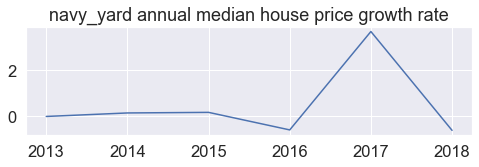

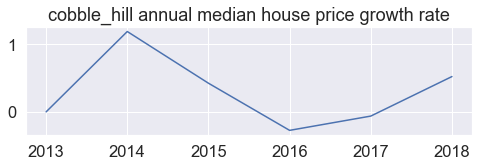

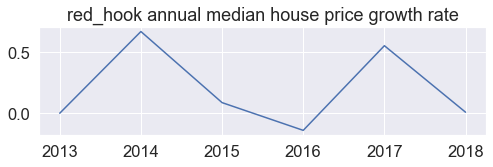

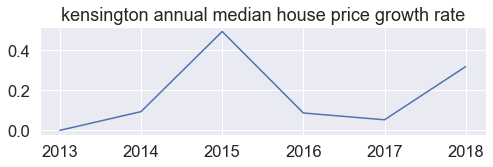

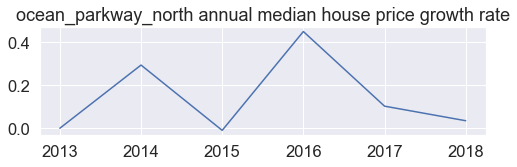

...

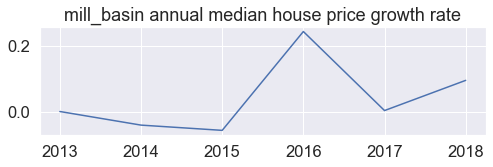

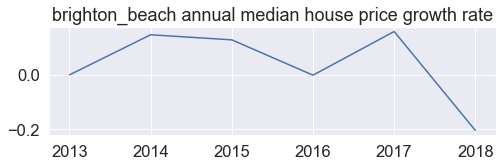

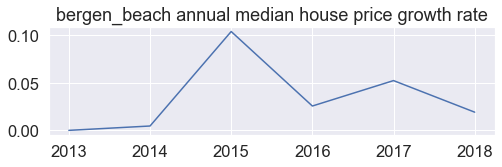

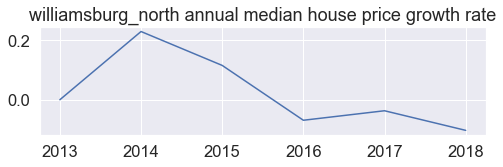

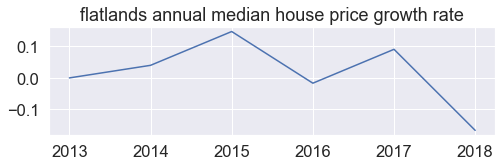

In [73]:
for i in bk_avg_median_growth_rate_ranking.index:
    fig = plt.gcf()
    sns.set(font_scale = 1.5)
    fig.set_size_inches(8, 2)
    plt.title(i + ' annual median house price growth rate')
    plt.plot(bk_neighborhood[bk_neighborhood.neighborhood==i].year, bk_neighborhood[bk_neighborhood.neighborhood==i].median_growth_rate)
    plt.show()
   

## 4.3 Queens:

### 4.3.1 Queens property sales price and market demand:
The growth rate of sales count and median price do not seem to fluctuate with same pattern in Queens.

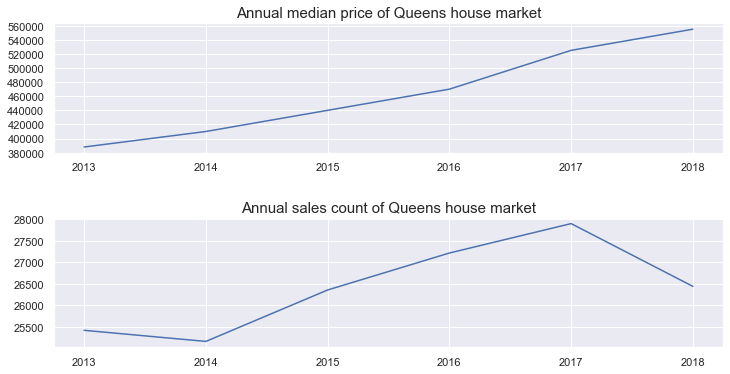

In [74]:
qns_year_price_median = qns.groupby('year').sale_price.median().to_frame(name='qns_median_price').reset_index()
qns_year_count_no_zero = qns_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.5)

sns.set(font_scale = 1)

plt.subplot(3,1,1)
plt.plot(qns_year_price_median.qns_median_price, label="Queens median price")
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);


plt.title("Annual median price of Queens house market", size=15);

plt.subplot(3,1,2)
plt.plot(qns_year_count_no_zero.sale_count, label='Queens sales count')
plt.title("Annual sales count of Queens house market", size=15);
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);

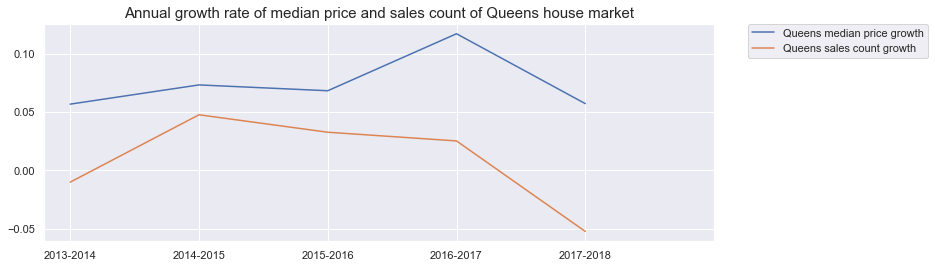

In [75]:
qns_year_sales_count_growth = []

for i in range(1, len(qns_year_count_no_zero.sale_count)):
    x = ((qns_year_count_no_zero.sale_count.iloc[i] - qns_year_count_no_zero.sale_count.iloc[i-1])/qns_year_count_no_zero.sale_count.iloc[i-1])
    qns_year_sales_count_growth.append(x)
    
    
    
qns_year_mid_price_growth = []

for i in range(1, len(qns_year_price_median.year)):
    x = ((qns_year_price_median.qns_median_price.iloc[i] - qns_year_price_median.qns_median_price.iloc[i-1])/qns_year_price_median.qns_median_price.iloc[i-1])
    qns_year_mid_price_growth.append(x)

plt.plot(qns_year_mid_price_growth, label="Queens median price growth")
plt.plot(qns_year_sales_count_growth, label='Queens sales count growth')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Queens house market", size=15);
plt.show()


### 4.3.2 Queens property sales price and neighborhood:

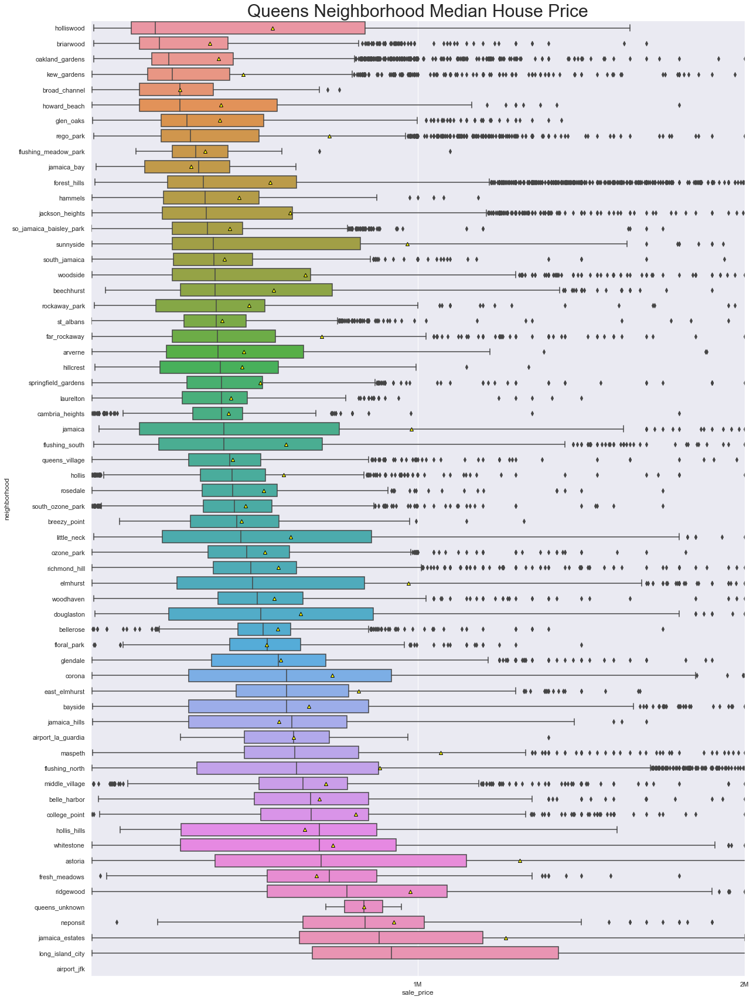

In [76]:
qns_neighborhood_median_sort = qns.groupby(['neighborhood']).median().sort_values('sale_price', ascending=True)

fig = plt.gcf();
fig.set_size_inches(20, 30);

qns_neighborhood_median_sort_boxplot = sns.boxplot(qns.sale_price, qns.neighborhood, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=qns_neighborhood_median_sort.index.tolist());
qns_neighborhood_median_sort_boxplot.set(xlim=(0, 2000000));
sns.set(font_scale = 2)
plt.xticks([1000000,2000000],['1M','2M'])
plt.title("Queens Neighborhood Median House Price", size=30);

Same problem as before which there exist some neighborhood which only have data for certain years.

In [77]:
# qns[qns.neighborhood == 'airport_jfk']

In [78]:
# qns[qns.neighborhood == 'queens_unknown']

In [79]:
# qns[qns.neighborhood == 'breezy_point']

In [80]:
qns_neighborhood_clean = qns[(qns.neighborhood != 'airport_jfk') & (qns.neighborhood != 'queens_unknown') & (qns.neighborhood != 'breezy_point')]


In [81]:
qns_neighborhood = qns_neighborhood_clean.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()

qns_neighborhood_median_growth_rate = []

for i in tqdm(range(0, len(qns_neighborhood))):
    if qns_neighborhood['neighborhood'].iloc[i] == qns_neighborhood['neighborhood'].iloc[i-1]:
        qns_neighborhood_median_growth_rate.append((qns_neighborhood.sale_price_median.iloc[i] - qns_neighborhood.sale_price_median.iloc[i-1])/qns_neighborhood.sale_price_median.iloc[i-1])
    else:
        qns_neighborhood_median_growth_rate.append(0)
        
qns_neighborhood['median_growth_rate'] = qns_neighborhood_median_growth_rate

In [82]:
# qns_neighborhood.neighborhood.value_counts()

In [83]:
qns_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(qns_neighborhood))):
    if qns_neighborhood['neighborhood'].iloc[i] != qns_neighborhood['neighborhood'].iloc[i-1]:
        qns_neighborhood_median_growth_rate_avg.append((qns_neighborhood.median_growth_rate.iloc[i+1]\
                                                   + qns_neighborhood.median_growth_rate.iloc[i+2]\
                                                   + qns_neighborhood.median_growth_rate.iloc[i+3]\
                                                   + qns_neighborhood.median_growth_rate.iloc[i+4]\
                                                   + qns_neighborhood.median_growth_rate.iloc[i+5])\
                                                   /5)
    else:
        qns_neighborhood_median_growth_rate_avg.append(0)
        
qns_neighborhood['median_growth_rate_avg'] = qns_neighborhood_median_growth_rate_avg

In [84]:
qns_avg_median_growth_rate_extract = qns_neighborhood[qns_neighborhood.median_growth_rate_avg!=0]

In [85]:
qns_avg_median_growth_rate_ranking = qns_avg_median_growth_rate_extract.drop(['year','sale_price_median','median_growth_rate'], axis=1).set_index('neighborhood').median_growth_rate_avg.sort_values(ascending=False)
qns_avg_median_growth_rate_ranking

neighborhood
holliswood                 0.261308
broad_channel              0.231671
jamaica_bay                0.146689
flushing_meadow_park       0.144200
howard_beach               0.138793
jamaica_hills              0.121599
airport_la_guardia         0.118292
jackson_heights            0.114243
far_rockaway               0.112606
so_jamaica_baisley_park    0.110169
woodside                   0.108786
rockaway_park              0.107835
east_elmhurst              0.106015
ridgewood                  0.104420
elmhurst                   0.103473
woodhaven                  0.102652
rego_park                  0.101461
belle_harbor               0.096413
briarwood                  0.095053
hammels                    0.094795
maspeth                    0.093729
college_point              0.092495
richmond_hill              0.090039
flushing_north             0.089368
forest_hills               0.088857
south_jamaica              0.087327
glendale                   0.086821
hollis         

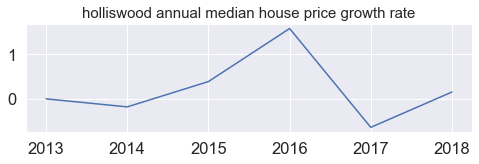

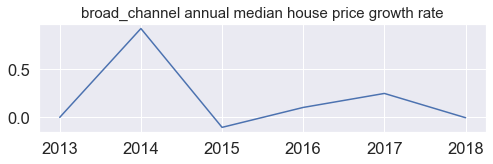

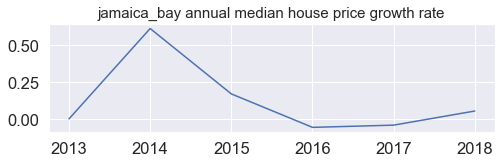

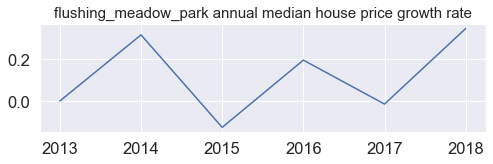

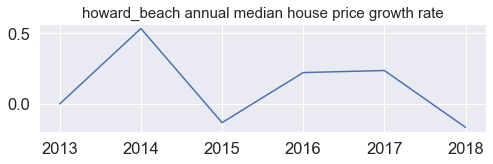

...

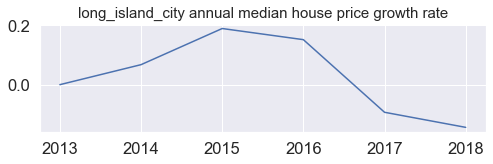

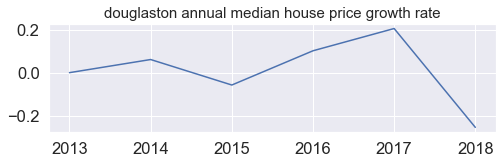

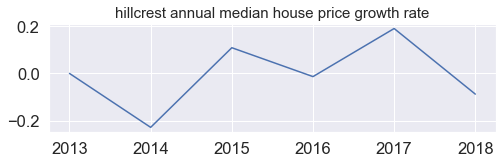

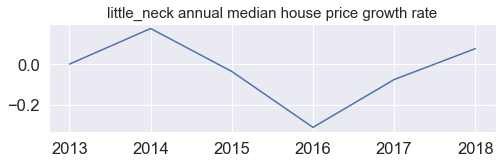

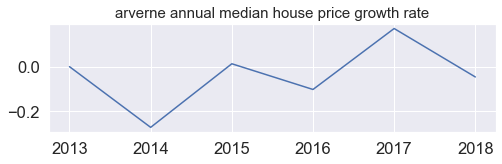

In [86]:
for i in qns_avg_median_growth_rate_ranking.index:
    sns.set(font_scale = 1.5)
    fig = plt.gcf()
    fig.set_size_inches(8, 2)
    plt.title(i + ' annual median house price growth rate', size=15)
    plt.plot(qns_neighborhood[qns_neighborhood.neighborhood==i].year, qns_neighborhood[qns_neighborhood.neighborhood==i].median_growth_rate)
    plt.show()

## 4.4 Bronx :

### 4.4.1 Bronx property sales price and market demand:
The annual growth rate of Bronx's median price and sales count do not follow the same pattern.

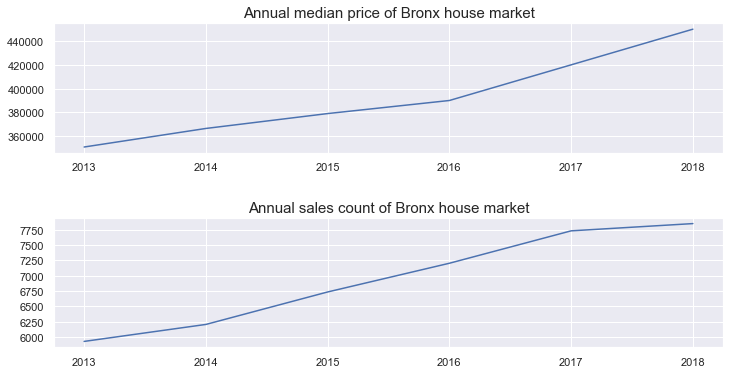

In [87]:
bx_year_price_median = bx.groupby('year').sale_price.median().to_frame(name='bx_median_price').reset_index()
bx_year_count_no_zero = bx_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.5)

sns.set(font_scale = 1)

plt.subplot(3,1,1)
plt.plot(bx_year_price_median.bx_median_price, label="Bronx median price")
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);


plt.title("Annual median price of Bronx house market", size=15);

plt.subplot(3,1,2)
plt.plot(bx_year_count_no_zero.sale_count, label='Bronx sales count')
plt.title("Annual sales count of Bronx house market", size=15);
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);

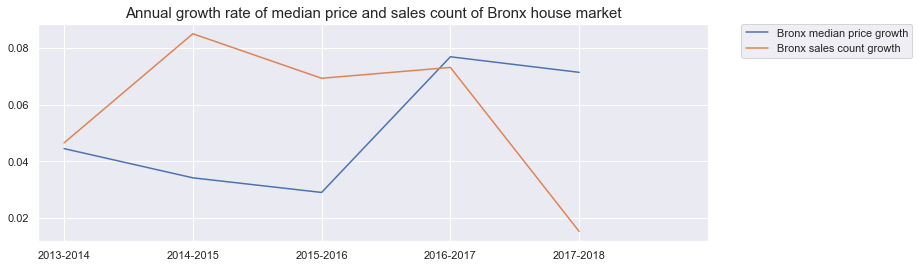

In [88]:
bx_year_sales_count_growth = []

for i in range(1, len(bx_year_count_no_zero.sale_count)):
    x = ((bx_year_count_no_zero.sale_count.iloc[i] - bx_year_count_no_zero.sale_count.iloc[i-1])/bx_year_count_no_zero.sale_count.iloc[i-1])
    bx_year_sales_count_growth.append(x)
    
    
    
bx_year_mid_price_growth = []

for i in range(1, len(bx_year_price_median.year)):
    x = ((bx_year_price_median.bx_median_price.iloc[i] - bx_year_price_median.bx_median_price.iloc[i-1])/bx_year_price_median.bx_median_price.iloc[i-1])
    bx_year_mid_price_growth.append(x)

plt.plot(bx_year_mid_price_growth, label="Bronx median price growth")
plt.plot(bx_year_sales_count_growth, label='Bronx sales count growth')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Bronx house market", size=15);
plt.show()



### 4.4.2 Bronx property sales price and neighborhood:

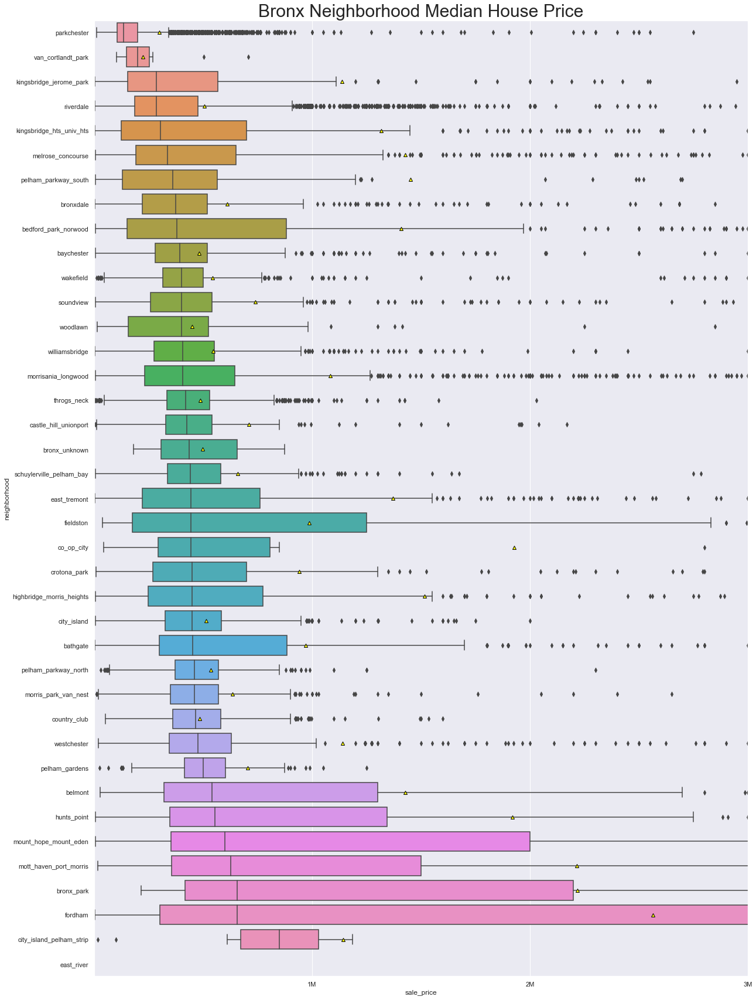

In [89]:
bx_neighborhood_median_sort = bx.groupby(['neighborhood']).median().sort_values('sale_price', ascending=True)

fig = plt.gcf();
fig.set_size_inches(20, 30);

bx_neighborhood_median_sort_boxplot = sns.boxplot(bx.sale_price, bx.neighborhood, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=bx_neighborhood_median_sort.index.tolist());
bx_neighborhood_median_sort_boxplot.set(xlim=(0, 3000000));
sns.set(font_scale = 3)
plt.xticks([1000000,2000000,3000000],['1M','2M','3M'])
plt.title("Bronx Neighborhood Median House Price", size=30);

In [90]:
# bx[bx.neighborhood == 'city_island_pelham_strip']

In [91]:
# bx[bx.neighborhood == 'east_river']

In [92]:
# bx[bx.neighborhood == 'bronx_park']

In [93]:
# bx[bxneighborhood == 'bronx_unknown']

In [94]:
bx_neighborhood_clean = bx[(bx.neighborhood != 'city_island_pelham_strip') & (bx.neighborhood != 'east_river') &\
                           (bx.neighborhood != 'bronx_park') & (bx.neighborhood != 'bronx_unknown')]



In [95]:
bx_neighborhood = bx_neighborhood_clean.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()

bx_neighborhood_median_growth_rate = []

for i in tqdm(range(0, len(bx_neighborhood))):
    if bx_neighborhood['neighborhood'].iloc[i] == bx_neighborhood['neighborhood'].iloc[i-1]:
        bx_neighborhood_median_growth_rate.append((bx_neighborhood.sale_price_median.iloc[i] - bx_neighborhood.sale_price_median.iloc[i-1])/bx_neighborhood.sale_price_median.iloc[i-1])
    else:
        bx_neighborhood_median_growth_rate.append(0)
        
bx_neighborhood['median_growth_rate'] = bx_neighborhood_median_growth_rate

In [96]:
# bx_neighborhood.neighborhood.value_counts()

In [97]:
bx_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(bx_neighborhood))):
    if bx_neighborhood['neighborhood'].iloc[i] != bx_neighborhood['neighborhood'].iloc[i-1]:
        bx_neighborhood_median_growth_rate_avg.append((bx_neighborhood.median_growth_rate.iloc[i+1]\
                                                   + bx_neighborhood.median_growth_rate.iloc[i+2]\
                                                   + bx_neighborhood.median_growth_rate.iloc[i+3]\
                                                   + bx_neighborhood.median_growth_rate.iloc[i+4]\
                                                   + bx_neighborhood.median_growth_rate.iloc[i+5])\
                                                   /5)
    else:
        bx_neighborhood_median_growth_rate_avg.append(0)
        
bx_neighborhood['median_growth_rate_avg'] = bx_neighborhood_median_growth_rate_avg

In [98]:
bx_avg_median_growth_rate_extract = bx_neighborhood[bx_neighborhood.median_growth_rate_avg!=0]

In [99]:
bx_avg_median_growth_rate_ranking = bx_avg_median_growth_rate_extract.drop(['year','sale_price_median','median_growth_rate'], axis=1).set_index('neighborhood').median_growth_rate_avg.sort_values(ascending=False)
bx_avg_median_growth_rate_ranking

neighborhood
kingsbridge_hts_univ_hts     0.227404
co_op_city                   0.216535
fieldston                    0.148937
mount_hope_mount_eden        0.133666
east_tremont                 0.132409
van_cortlandt_park           0.125215
mott_haven_port_morris       0.098850
melrose_concourse            0.092638
kingsbridge_jerome_park      0.089516
castle_hill_unionport        0.083315
pelham_parkway_south         0.077297
bedford_park_norwood         0.075233
parkchester                  0.074220
belmont                      0.072037
morrisania_longwood          0.071800
bronxdale                    0.070167
williamsbridge               0.067054
baychester                   0.066405
morris_park_van_nest         0.066323
bathgate                     0.065689
schuylerville_pelham_bay     0.062049
pelham_gardens               0.061969
wakefield                    0.061507
country_club                 0.060990
pelham_parkway_north         0.059336
city_island                  0.055872

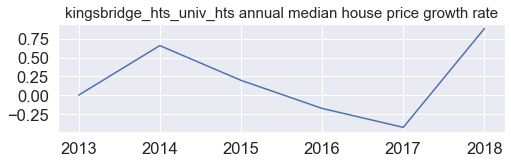

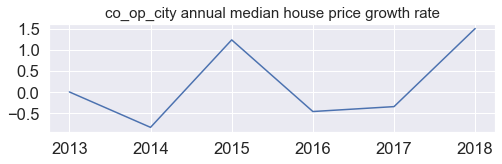

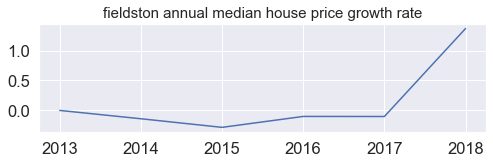

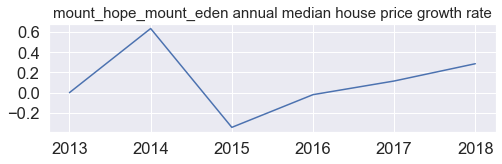

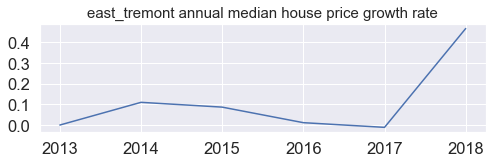

...

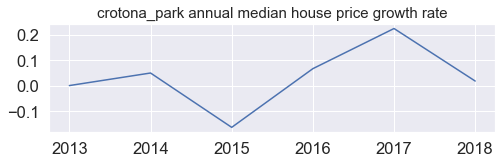

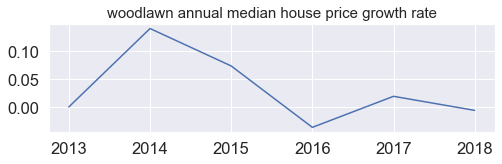

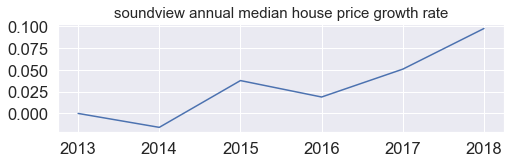

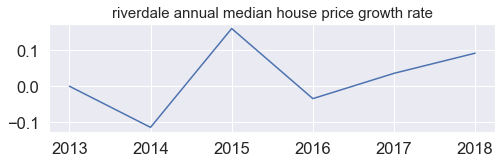

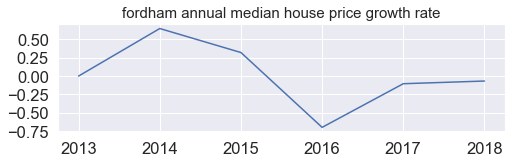

In [100]:
for i in bx_avg_median_growth_rate_ranking.index:
    fig = plt.gcf()
    fig.set_size_inches(8, 2)
    sns.set(font_scale = 1.5)
    plt.locator_params(nbins=6)
    plt.title(i + ' annual median house price growth rate', size=15)
    plt.plot(bx_neighborhood[bx_neighborhood.neighborhood==i].year, bx_neighborhood[bx_neighborhood.neighborhood==i].median_growth_rate)
    plt.show()

## 4.5 Staten Island:

### 4.5.1 Bronx property sales price and market demand:
There do not seem to have correlation between Staten Island's annual growth rate of median house price and sales counts, but what is interesting about the graph is that there is a nearly 20% plunge of annual sales count growth rate between 2017-2018

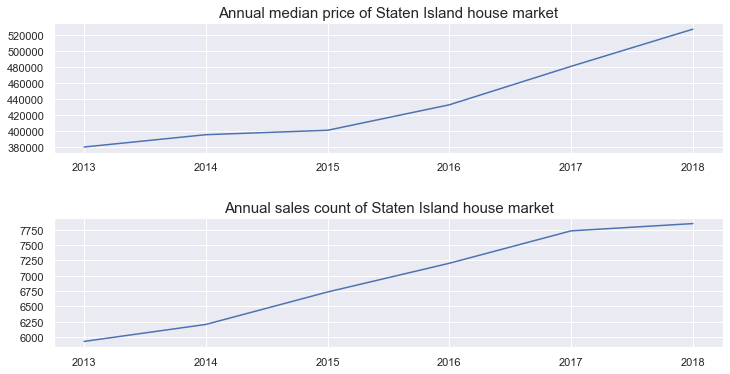

In [101]:
stn_year_price_median = stn.groupby('year').sale_price.median().to_frame(name='stn_median_price').reset_index()
stn_year_count_no_zero = stn_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

plt.subplots_adjust(left=None, bottom=0, right=None, top=1.8, wspace=None, hspace=0.5)

sns.set(font_scale = 1)

plt.subplot(3,1,1)
plt.plot(stn_year_price_median.stn_median_price, label="Staten Island median price")
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);


plt.title("Annual median price of Staten Island house market", size=15);

plt.subplot(3,1,2)
plt.plot(bx_year_count_no_zero.sale_count, label='Staten Island sales count')
plt.title("Annual sales count of Staten Island house market", size=15);
plt.locator_params(nbins=10)
plt.xticks([0,1,2,3,4,5],['2013', '2014', '2015', '2016', '2017', '2018']);

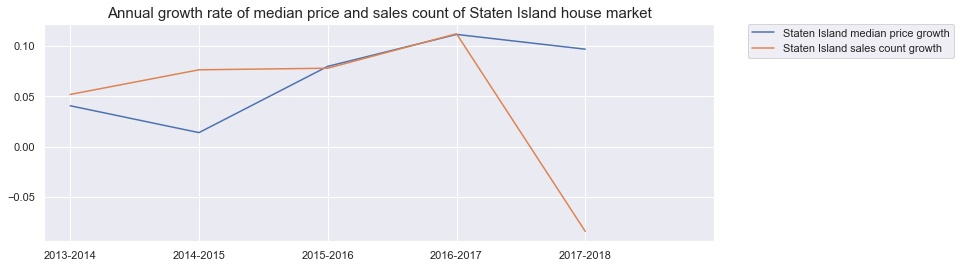

In [102]:
stn_year_sales_count_growth = []

for i in range(1, len(stn_year_count_no_zero.sale_count)):
    x = ((stn_year_count_no_zero.sale_count.iloc[i] - stn_year_count_no_zero.sale_count.iloc[i-1])/stn_year_count_no_zero.sale_count.iloc[i-1])
    stn_year_sales_count_growth.append(x)
    
    
    
stn_year_mid_price_growth = []

for i in range(1, len(stn_year_price_median.year)):
    x = ((stn_year_price_median.stn_median_price.iloc[i] - stn_year_price_median.stn_median_price.iloc[i-1])/stn_year_price_median.stn_median_price.iloc[i-1])
    stn_year_mid_price_growth.append(x)

plt.plot(stn_year_mid_price_growth, label="Staten Island median price growth")
plt.plot(stn_year_sales_count_growth, label='Staten Island sales count growth')

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Staten Island house market", size=15);
plt.show()



### 4.5.2 Staten Island property sales price and neighborhood:

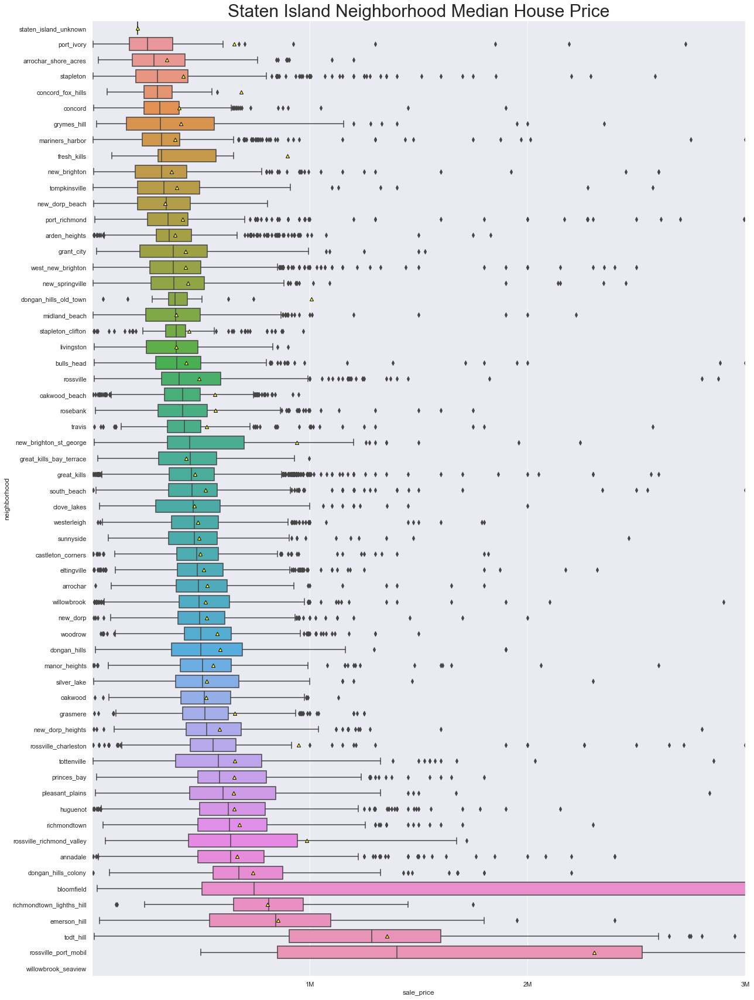

In [103]:
stn_neighborhood_median_sort = stn.groupby(['neighborhood']).median().sort_values('sale_price', ascending=True)

fig = plt.gcf();
fig.set_size_inches(20, 30);

stn_neighborhood_median_sort_boxplot = sns.boxplot(stn.sale_price, stn.neighborhood, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=stn_neighborhood_median_sort.index.tolist());
stn_neighborhood_median_sort_boxplot.set(xlim=(0, 3000000));
sns.set(font_scale = 1.5)
plt.xticks([1000000,2000000,3000000],['1M','2M','3M'])
plt.title("Staten Island Neighborhood Median House Price", size=30);

In [104]:
# stn[stn.neighborhood == 'fresh_kills']

In [105]:
# stn[stn.neighborhood == 'willowbrook_seaview']

In [106]:
# stn[stn.neighborhood == 'staten_island_unknown']

In [107]:
stn_neighborhood_clean = stn[(stn.neighborhood != 'fresh_kills') & (stn.neighborhood != 'willowbrook_seaview') &\
                           (stn.neighborhood != 'staten_island_unknown')]




In [108]:
stn_neighborhood = stn_neighborhood_clean.groupby(['neighborhood','year']).sale_price.median().to_frame(name='sale_price_median').reset_index()

stn_neighborhood_median_growth_rate = []

for i in tqdm(range(0, len(stn_neighborhood))):
    if stn_neighborhood['neighborhood'].iloc[i] == stn_neighborhood['neighborhood'].iloc[i-1]:
        stn_neighborhood_median_growth_rate.append((stn_neighborhood.sale_price_median.iloc[i] - stn_neighborhood.sale_price_median.iloc[i-1])/stn_neighborhood.sale_price_median.iloc[i-1])
    else:
        stn_neighborhood_median_growth_rate.append(0)
        
stn_neighborhood['median_growth_rate'] = stn_neighborhood_median_growth_rate

In [109]:
stn_neighborhood_median_growth_rate_avg = []

for i in tqdm(range(0, len(stn_neighborhood))):
    if stn_neighborhood['neighborhood'].iloc[i] != stn_neighborhood['neighborhood'].iloc[i-1]:
        stn_neighborhood_median_growth_rate_avg.append((stn_neighborhood.median_growth_rate.iloc[i+1]\
                                                   + stn_neighborhood.median_growth_rate.iloc[i+2]\
                                                   + stn_neighborhood.median_growth_rate.iloc[i+3]\
                                                   + stn_neighborhood.median_growth_rate.iloc[i+4]\
                                                   + stn_neighborhood.median_growth_rate.iloc[i+5])\
                                                   /5)
    else:
        stn_neighborhood_median_growth_rate_avg.append(0)
        
stn_neighborhood['median_growth_rate_avg'] = stn_neighborhood_median_growth_rate_avg

In [110]:
stn_avg_median_growth_rate_extract = stn_neighborhood[stn_neighborhood.median_growth_rate_avg!=0]

In [111]:
stn_avg_median_growth_rate_ranking = stn_avg_median_growth_rate_extract.drop(['year','sale_price_median','median_growth_rate'], axis=1).set_index('neighborhood').median_growth_rate_avg.sort_values(ascending=False)
stn_avg_median_growth_rate_ranking

neighborhood
dongan_hills_old_town        3.850851
bloomfield                   1.050590
rossville_port_mobil         0.406050
grymes_hill                  0.191610
new_dorp_beach               0.180245
stapleton_clifton            0.170260
new_brighton_st_george       0.155618
rossville_richmond_valley    0.141849
concord_fox_hills            0.140548
arrochar_shore_acres         0.135402
midland_beach                0.112999
great_kills_bay_terrace      0.108210
emerson_hill                 0.106586
new_brighton                 0.102503
grant_city                   0.096443
bulls_head                   0.095584
todt_hill                    0.094730
dongan_hills                 0.093837
mariners_harbor              0.093465
clove_lakes                  0.092019
stapleton                    0.091559
sunnyside                    0.090159
arrochar                     0.089875
rosebank                     0.089057
oakwood_beach                0.087869
west_new_brighton            0.084507

In [112]:
# stn[stn.neighborhood=='dongan_hills_old_town']

The abnoraml high average of annual median house price growth rate in dongan_hills_old_town is due to there is only one high price transaction in year 2018.

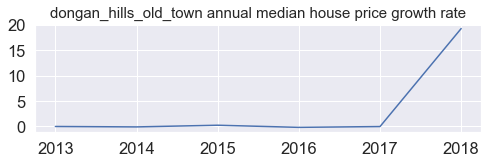

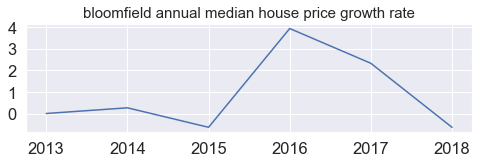

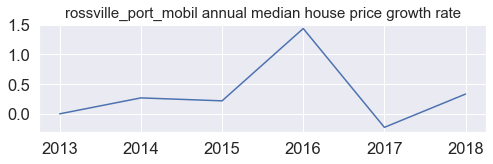

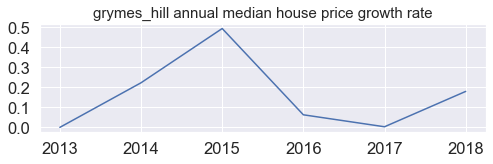

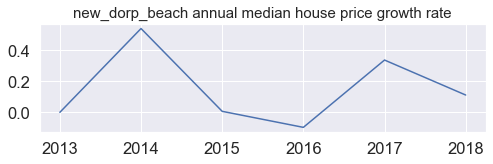

...

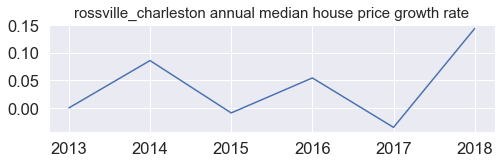

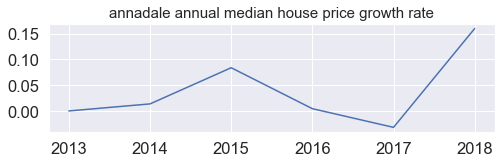

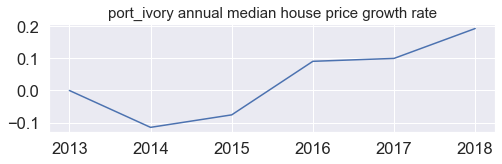

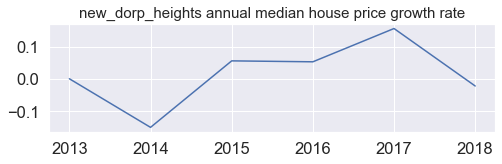

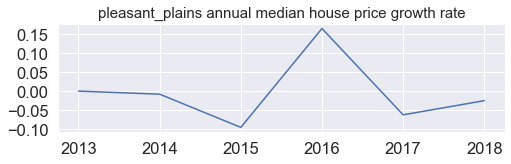

In [113]:
for i in stn_avg_median_growth_rate_ranking.index:
    fig = plt.gcf()
    fig.set_size_inches(8, 2)
    sns.set(font_scale = 1.5)
    plt.locator_params(nbins=6)
    plt.title(i + ' annual median house price growth rate', size=15)
    plt.plot(stn_neighborhood[stn_neighborhood.neighborhood==i].year, stn_neighborhood[stn_neighborhood.neighborhood==i].median_growth_rate)
    plt.show()

# 5. Building class & sale_price

## 5.0 Understanding and categorized classification
### From the building class below I am going to extract some of them (for resident use, tax class 1 & 2) into 3 category: house (dwellings), condo, and coop

Every property in the city is assigned to one of four tax classes (Classes 1, 2, 3, and 4),
based on the use of the property.
* Class 1: Includes most residential property of up to three units (such as one-,
two-, and three-family homes and small stores or offices with one or two
attached apartments), vacant land that is zoned for residential use, and most
condominiums that are not more than three stories.
* Class 2: Includes all other property that is primarily residential, such as
cooperatives and condominiums.
* Class 3: Includes property with equipment owned by a gas, telephone or electric
company.
* Class 4: Includes all other properties not included in class 1,2, and 3, such as
offices, factories, warehouses, garage buildings, etc. 

building_class_category, tax_class_at_present, building_class_at_present,tax_class_at_time_of_sale,building_class_at_time_of_sale,
block,lot

In [114]:
nyc_class = nyc14.groupby(['tax_class_at_time_of_sale','building_class_category']).building_class_category.count().to_frame(name='count').reset_index()


Many people confuse condos with co-ops, thinking they are interchangeable. A condo is a private residence in a multiunit structure that includes ownership of commonly used property. A co-op is also a multiunit building, but that’s where the similarities end. A co-op owner has an interest or share in the entire building and a contract or lease that allows the owner to occupy a unit. While a condo owner owns a unit, a co-op owner does not own the unit.

A condominium, often shortened to condo, in the United States of America and in most Canadian provinces, is a type of living space similar to an apartment but independently sellable and therefore regarded as real estate. The condominium building structure is divided into several units that are each separately owned, surrounded by common areas that are jointly owned.

In [115]:
# nyc_class

In [116]:
# house = nyc14[(nyc14.building_class_category == '01_one_family_dwellings')\
#              | (nyc14.building_class_category == '02_two_family_dwellings')\
#              | (nyc14.building_class_category == '03_three_family_dwellings')]

In [117]:
# house.sale_price.median(): 550000.0

In [118]:
# coop = nyc14[(nyc14.building_class_category == '09_coops_walkup_apartments')\
#              | (nyc14.building_class_category == '10_coops_elevator_apartments')]

In [119]:
# coop.sale_price.median(): 385000.0

In [120]:
# condo = nyc14[(nyc14.building_class_category == '04_tax_class_1_condos')\
#              | (nyc14.building_class_category == '11_special_condo_billing_lots')\
#              | (nyc14.building_class_category == '11a_condo_rentals')\
#              | (nyc14.building_class_category == '12_condos_walkup_apartments')\
#              | (nyc14.building_class_category == '13_condos_elevator_apartments')\
#              | (nyc14.building_class_category == '15_condos_2_10_unit_residential')\
#              | (nyc14.building_class_category == '16_condos_2_10_unit_with_commercial_unit')]

In [121]:
# condo.sale_price.median(): 857000.0

In [122]:
# rentals = nyc14[(nyc14.building_class_category == '07_rentals_walkup_apartments')\
#               | (nyc14.building_class_category == '08_rentals_elevator_apartments')]

In [123]:
# rentals.sale_price.median(): 1720000.0

Want to figure out which building type rentals belong to I first put them into category, and then realized they have comparably higher median price, so I add one more column in the groupby function, and realized that the rental type include: luxury building, building for certified artists, building for more 6+ families, etc. Hence, the price of rental category is very high. By adding the column, I realized it will be better to actually categorized co-op, condo and house with column: building_class_at_time_of_sale.

NYC Building Class Code Descriptions: https://www1.nyc.gov/assets/finance/jump/hlpbldgcode.html

In [124]:
nyc_class1 = nyc14.groupby(['tax_class_at_time_of_sale','building_class_category','building_class_at_time_of_sale']).building_class_category.count().to_frame(name='count').reset_index()

In [125]:
# nyc_class1

In NYC, an apartment can be a condo or a coop or even both, the following categories will not be included in the list, since it is not clear which kind they belongs to.

* C7	WALK-UP APT. OVER SIX FAMILIES WITH STORES
* C9	GARDEN APARTMENTS
* D1	ELEVATOR APT; SEMI-FIREPROOF WITHOUT STORES
* D2	ELEVATOR APT; ARTISTS IN RESIDENCE
* D3	ELEVATOR APT; FIREPROOF WITHOUT STORES
* D5	ELEVATOR APT; CONVERTED
* D6	ELEVATOR APT; FIREPROOF WITH STORES
* D7	ELEVATOR APT; SEMI-FIREPROOF WITH STORES
* D8	ELEVATOR APT; LUXURY TYPE
* D9	ELEVATOR APT; MISCELLANEOUS
* R9	CO-OP WITHIN A CONDOMINIUM

In [126]:
list_house = ['A0', 'A1', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'S0', 'S1', 'S2', 'S3', 'S4', 'S5', 'S9'\
             ,'B1', 'B2', 'B3', 'B9', 'C0', 'C1', 'C2', 'C3', 'C4', 'C5','CM']

In [127]:
list_condo = ['R3', 'R6', 'R7', 'R0', 'RR', 'R2', 'R4', 'R1', 'R8']

In [128]:
list_coop = ['D0', 'C6', 'C8', 'D4']

In [129]:
list_apartment_not_define = ['C7', 'C9', 'D1', 'D2', 'D3', 'D5', 'D6', 'D7', 'D8', 'D9', 'R9']

In [130]:
house_cat = []

for i in tqdm(range(0, len(nyc14))):
    if nyc14.building_class_at_time_of_sale.iloc[i] in list_house:
        house_cat.append(i)

In [131]:
condo_cat = []

for i in tqdm(range(0, len(nyc14))):
    if nyc14.building_class_at_time_of_sale.iloc[i] in list_condo:
        condo_cat.append(i)

In [132]:
coop_cat = []

for i in tqdm(range(0, len(nyc14))):
    if nyc14.building_class_at_time_of_sale.iloc[i] in list_coop:
        coop_cat.append(i)

In [133]:
apartment_cat = []

for i in tqdm(range(0, len(nyc14))):
    if nyc14.building_class_at_time_of_sale.iloc[i] in list_apartment_not_define:
        apartment_cat.append(i)

In [134]:
other_cat = []

for i in tqdm(range(0, len(nyc14))):
    if ((nyc14.building_class_at_time_of_sale.iloc[i] not in list_house)\
     & (nyc14.building_class_at_time_of_sale.iloc[i] not in list_condo)\
     & (nyc14.building_class_at_time_of_sale.iloc[i] not in list_house)\
     & (nyc14.building_class_at_time_of_sale.iloc[i] not in list_apartment_not_define)):
        other_cat.append(i)

Here going to add a new column for future visualization, and analysis purpose, by seperating the building classification in to 5 categories: 
* residential: house, condo, coop, apartment_not_define(not defined as condo or coop)
* non-residential: others(parking lot, hotel, commercial, etc)

In [135]:
house = nyc14.iloc[house_cat]

In [136]:
condo = nyc14.iloc[condo_cat]

In [137]:
coop = nyc14.iloc[coop_cat]

In [138]:
apartment_not_define = nyc14.iloc[apartment_cat]

In [139]:
others = nyc14.iloc[other_cat]

In [140]:
house_c = nyc2.iloc[house_cat]
condo_c = nyc2.iloc[condo_cat]
coop_c = nyc2.iloc[coop_cat]
apartment_not_define_c = nyc2.iloc[apartment_cat]
others_c = nyc2.iloc[other_cat]

In [141]:
nyc14['house_type'] = 'others'

In [142]:
nyc14['house_type'].iloc[house_cat] = 'house'
nyc14['house_type'].iloc[condo_cat] = 'condo'
nyc14['house_type'].iloc[coop_cat] = 'coop'
nyc14['house_type'].iloc[apartment_cat] = 'apartment_not_define'

/Users/justin/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [143]:
nyc2['house_type'] = 'others'

In [144]:
nyc2['house_type'].iloc[house_cat] = 'house'
nyc2['house_type'].iloc[condo_cat] = 'condo'
nyc2['house_type'].iloc[coop_cat] = 'coop'
nyc2['house_type'].iloc[apartment_cat] = 'apartment_not_define'

## 5.1 Different house type and their price

In [145]:
normality_test(house.sale_price)
normality_test(condo.sale_price)
normality_test(coop.sale_price)

p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is not nomrmal.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is not nomrmal.
p-value: 0.0  < 0.05, reject the null hypothesis, this distribution is not nomrmal.


Since the distribution of these three type of houses seems to be similiar, we can apply Mann-Whitney U test, to check if one is more expensive than others.

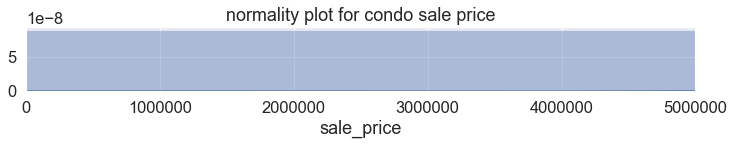

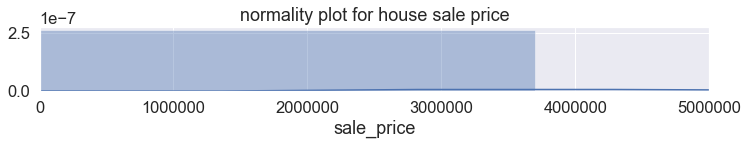

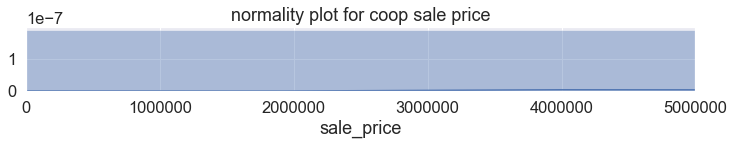

In [146]:
plt.subplot(3,1,1)
normality_plot_condo = sns.distplot(condo.sale_price)
normality_plot_condo.set(xlim=(0, 5000000));
plt.title('normality plot for condo sale price');
plt.show()

plt.subplot(3,1,2)
normality_plot_house = sns.distplot(house.sale_price)
normality_plot_house.set(xlim=(0, 5000000));
plt.title('normality plot for house sale price');
plt.show()

plt.subplot(3,1,3)
normality_plot_coop = sns.distplot(coop.sale_price)
normality_plot_coop.set(xlim=(0, 5000000));
plt.title('normality plot for coop sale price');
plt.show()

From the plot below we can see that condo have a higher median price compare to house then coop, by applying Mannwhitney-U test, the result shows that condo indeed have the higher sale price in general, followed by the house then coop.

In [147]:
print(hypo_1side(condo.sale_price, coop.sale_price))
print(hypo_1side(house.sale_price, coop.sale_price))


P-value: 1.000000, x house price is higher than y
P-value: 1.000000, x house price is higher than y


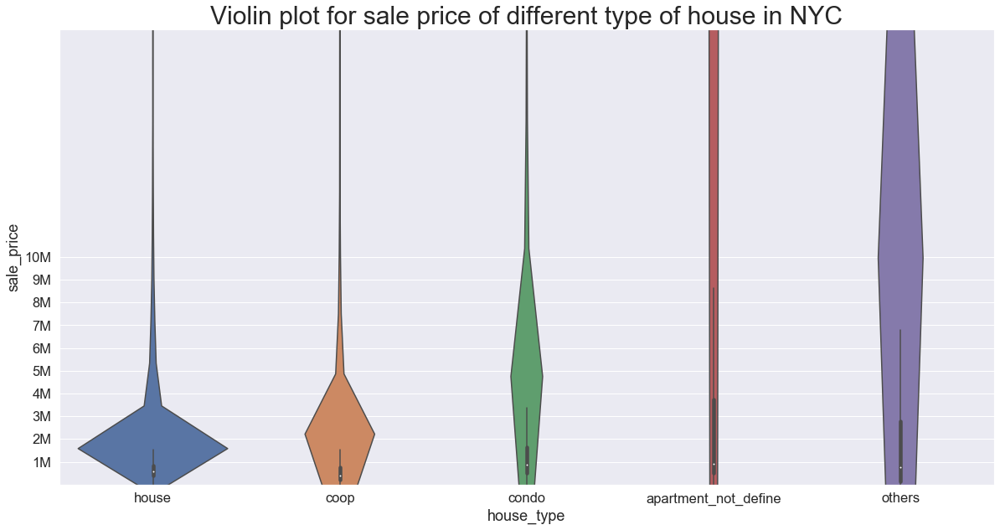

In [148]:
fig = plt.gcf()
fig.set_size_inches(20, 10)
house_type_violinplot = sns.violinplot(nyc14.house_type, nyc14.sale_price, order=['house', 'coop', 'condo', 'apartment_not_define', 'others']);
house_type_violinplot.set(ylim=(0, 20000000));
plt.title('Violin plot for sale price of different type of house in NYC', size=30);
plt.yticks([1000000,2000000,3000000,4000000,5000000,6000000,7000000,8000000,9000000,10000000],['1M','2M','3M','4M','5M','6M','7M','8M','9M','10M']);


Median price of coop and house seems to grow steadily across 2013-2018. Median price of condo start declining in 2017,

In [149]:
nyc_house_type_median = nyc14.groupby(['house_type','year']).sale_price.median().to_frame(name='median_sale_price').reset_index()

px.line(nyc_house_type_median,'year', 'median_sale_price', color='house_type',title='Annual median sale price for different type of house in NYC', height=500, width=1000)

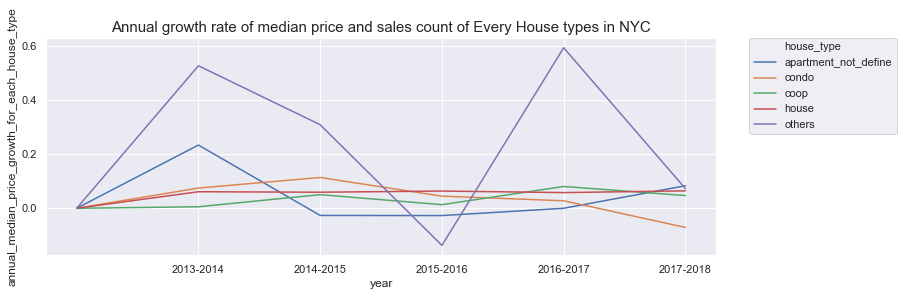

In [307]:
annual_diff_type_mid_price_growth = []

for i in range(0, len(nyc_house_type_median.year)):
    if nyc_house_type_median.house_type.iloc[i] == nyc_house_type_median.house_type.iloc[i-1]:
        x = ((nyc_house_type_median.median_sale_price.iloc[i] - nyc_house_type_median.median_sale_price.iloc[i-1])/nyc_house_type_median.median_sale_price.iloc[i-1])
        annual_diff_type_mid_price_growth.append(x)
    else:
        annual_diff_type_mid_price_growth.append(0)
        
nyc_house_type_median['annual_median_price_growth_for_each_house_type'] = annual_diff_type_mid_price_growth


sns.lineplot(nyc_house_type_median.year, nyc_house_type_median.annual_median_price_growth_for_each_house_type,\
           hue=nyc_house_type_median.house_type)


plt.locator_params(nbins=5)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks([2014,2015,2016,2017,2018],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Every House types in NYC", size=15);
plt.show()

In [308]:
annual_diff_type_mid_price_growth_avg = []

for i in tqdm(range(0, len(nyc_house_type_median))):
    if nyc_house_type_median['house_type'].iloc[i] != nyc_house_type_median['house_type'].iloc[i-1]:
        annual_diff_type_mid_price_growth_avg.append((nyc_house_type_median.annual_median_price_growth_for_each_house_type.iloc[i+1]\
                                                   + nyc_house_type_median.annual_median_price_growth_for_each_house_type.iloc[i+2]\
                                                   + nyc_house_type_median.annual_median_price_growth_for_each_house_type.iloc[i+3]\
                                                   + nyc_house_type_median.annual_median_price_growth_for_each_house_type.iloc[i+4]\
                                                   + nyc_house_type_median.annual_median_price_growth_for_each_house_type.iloc[i+5])\
                                                   /5)
    else:
        annual_diff_type_mid_price_growth_avg.append(0)
        
nyc_house_type_median['annual_diff_type_mid_price_growth_rate_avg'] = annual_diff_type_mid_price_growth_avg


In [312]:
nyc_house_types_median_growth_rate_avg_extract = nyc_house_type_median[nyc_house_type_median.annual_diff_type_mid_price_growth_rate_avg!=0]


In [314]:
nyc_house_types_median_growth_rate_avg_ranking = nyc_house_types_median_growth_rate_avg_extract.drop(['year','median_sale_price','annual_median_price_growth_for_each_house_type'], axis=1).set_index('house_type').annual_diff_type_mid_price_growth_rate_avg.sort_values(ascending=False)
nyc_house_types_median_growth_rate_avg_ranking


house_type
others                  0.273252
house                   0.061380
apartment_not_define    0.052766
coop                    0.039433
condo                   0.038093
Name: annual_diff_type_mid_price_growth_rate_avg, dtype: float64

All the properties for residential use show decline in amount of sales from 2013 to 2018.

In [150]:
nyc_house_type_count = nyc2.groupby(['house_type','year']).sale_price.count().to_frame(name='sale_count').reset_index()

px.line(nyc_house_type_count,'year', 'sale_count', color='house_type',title='Annual sales counts for different type of house in NYC', height=500, width=1000)


which neiborhood have the highest and lowest avg growhth rate for each type of house

In [151]:
house_year_price_median = house.groupby('year').sale_price.median().to_frame(name='house_median_price').reset_index()
house_year_count_no_zero = house_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

condo_year_price_median = condo.groupby('year').sale_price.median().to_frame(name='condo_median_price').reset_index()
condo_year_count_no_zero = condo_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()

coop_year_price_median = coop.groupby('year').sale_price.median().to_frame(name='coop_median_price').reset_index()
coop_year_count_no_zero = coop_c.groupby('year').sale_price.count().to_frame(name='sale_count').reset_index()



## 5.2 House

From the plot below we can see that median price of house in NYC have a very stable annual growth rate(approx 6%) which is not affected by the sales count.

The amount of sale for house shows a significant decline in 2015-2016, can reserch later to see what might be the cause for this sharp decline.

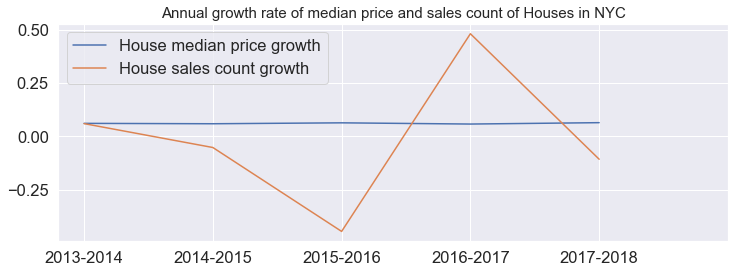

In [152]:
annual_house_sales_count_growth = []

for i in range(1, len(house_year_count_no_zero.sale_count)):
    x = ((house_year_count_no_zero.sale_count.iloc[i] - house_year_count_no_zero.sale_count.iloc[i-1])/house_year_count_no_zero.sale_count.iloc[i-1])
    annual_house_sales_count_growth.append(x)
    
    
annual_house_mid_price_growth = []

for i in range(1, len(house_year_price_median.year)):
    x = ((house_year_price_median.house_median_price.iloc[i] - house_year_price_median.house_median_price.iloc[i-1])/house_year_price_median.house_median_price.iloc[i-1])
    annual_house_mid_price_growth.append(x)

plt.plot(annual_house_mid_price_growth, label="House median price growth")
plt.plot(annual_house_sales_count_growth, label='House sales count growth')

plt.legend()
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of Houses in NYC", size=15);
plt.show()




Originally want to do the growth rate of median house price for each neighborhood, but after filtering out neighborhoods with sales count less than 30 and neighborhoods with missing year, there are only 20 neighborhoods left, hence, going to do the growth rate for each borough instead.

In [153]:
house_neighborhood = house.groupby(['borough_name','neighborhood','year']).sale_price.median().to_frame('median_sale_price_for_houses_in_each_neighborhood').reset_index()

In [154]:
# house_neighborhood

In [155]:
# house_neighborhood_c = house_c.groupby(['borough_name','neighborhood','year']).sale_price.count().to_frame('sale_count_for_houses_in_each_neighborhood').reset_index()
# house_neighborhood_count_more_than_30 = house_neighborhood_c[house_neighborhood_c.sale_count_for_houses_in_each_neighborhood >= 30]

In [156]:
# house_neighborhood_count_more_than_30_with_every_year = house_neighborhood_count_more_than_30[house_neighborhood_count_more_than_30.neighborhood.value_counts()==6]

In [157]:
# house_neighborhood_count_more_than_30.neighborhood.value_counts()

In [158]:
house_borough = house.groupby(['borough_name','year']).sale_price.median().to_frame('median_sale_price_for_houses_in_each_borough').reset_index()


In [159]:
annual_house_median_growth_rate_list = []

for i in range(0, len(house_borough)):
    if house_borough.borough_name.iloc[i] == house_borough.borough_name.iloc[i-1]:
        annual_house_median_growth_rate_list.append((house_borough.median_sale_price_for_houses_in_each_borough.iloc[i]\
                                               - house_borough.median_sale_price_for_houses_in_each_borough.iloc[i-1])\
                                               / house_borough.median_sale_price_for_houses_in_each_borough.iloc[i-1])
    else:
        annual_house_median_growth_rate_list.append(0)

In [160]:
house_borough['median_house_price_annual_growth_borough'] = annual_house_median_growth_rate_list


In [161]:
# house_borough

From the plot below, we can see that growth rate of median price for house in manhattan is unstable, compare to annual median house price growth rate of other boroughs.

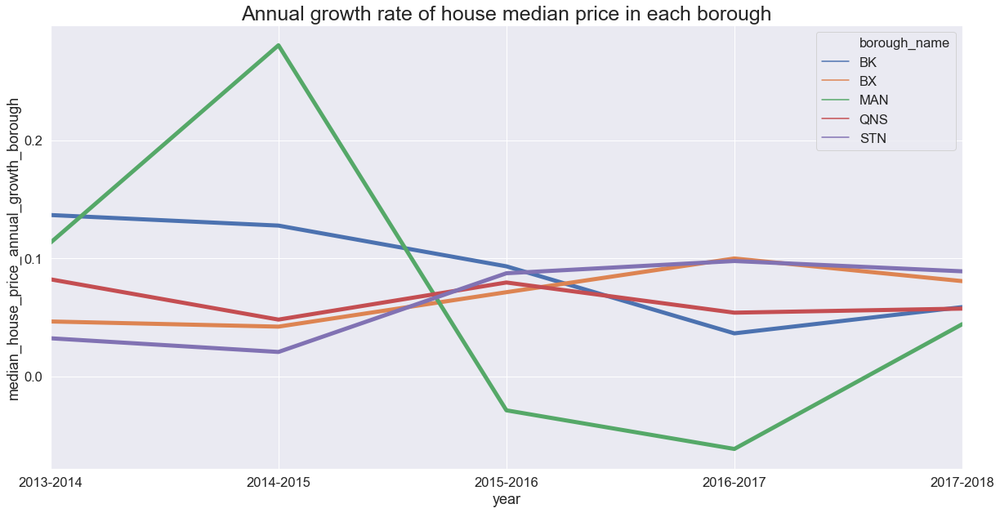

In [162]:
sns.lineplot(house_borough.year, house_borough.median_house_price_annual_growth_borough, hue=house_borough.borough_name, linewidth=5)

fig = plt.gcf()
fig.set_size_inches(20, 10)

plt.legend()
plt.locator_params(nbins=5)
plt.xlim(2014, 2018)
plt.xticks([2014,2015,2016,2017,2018],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of house median price in each borough", size=25);
plt.show()



In [163]:
house_borough_median_growth_rate_avg = []

for i in tqdm(range(0, len(house_borough))):
    if house_borough['borough_name'].iloc[i] != house_borough['borough_name'].iloc[i-1]:
        house_borough_median_growth_rate_avg.append((house_borough.median_house_price_annual_growth_borough.iloc[i+1]\
                                                   + house_borough.median_house_price_annual_growth_borough.iloc[i+2]\
                                                   + house_borough.median_house_price_annual_growth_borough.iloc[i+3]\
                                                   + house_borough.median_house_price_annual_growth_borough.iloc[i+4]\
                                                   + house_borough.median_house_price_annual_growth_borough.iloc[i+5])\
                                                   /5)
    else:
        house_borough_median_growth_rate_avg.append(0)
        
house_borough['house_borough_median_growth_rate_avg'] = house_borough_median_growth_rate_avg

In [164]:
house_borough_median_growth_rate_avg_extract = house_borough[house_borough.house_borough_median_growth_rate_avg!=0]

In [165]:
# house_borough_median_growth_rate_avg_extract

In [166]:
house_borough_median_growth_rate_avg_ranking = house_borough_median_growth_rate_avg_extract.drop(['year','median_sale_price_for_houses_in_each_borough','median_house_price_annual_growth_borough'], axis=1).set_index('borough_name').house_borough_median_growth_rate_avg.sort_values(ascending=False)
house_borough_median_growth_rate_avg_ranking

borough_name
BK     0.090663
MAN    0.069680
BX     0.068235
STN    0.065535
QNS    0.064371
Name: house_borough_median_growth_rate_avg, dtype: float64

In [167]:
# fig = plt.gcf()
# fig.set_size_inches(30, 30)

# house_plot = sns.scatterplot(house.sale_date, house.sale_price, hue=house.building_class_at_time_of_sale, s=90);
# house_plot.set_xlim([dt.date(2013, 1, 1), dt.date(2018, 12, 31)]);
# house_plot.set_ylim(0, 20000000);
# plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.title('Different type of house and their price trend');

In [168]:
house_types_sorted = house.groupby('building_class_at_time_of_sale').sale_price.median().to_frame('house_types_median_sale_price').sort_values('house_types_median_sale_price').reset_index()


3 types of house with highest median price:
* A7	MANSION TYPE OR TOWN HOUSE
* C4	OLD LAW TENEMENT
* C1	OVER SIX FAMILIES WITHOUT STORES

3 types of house with lowest median price:
* CM	MOBILE HOMES/TRAILER PARKS
* A6	SUMMER COTTAGE
* A8	BUNGALOW COLONY - COOPERATIVELY OWNED LAND

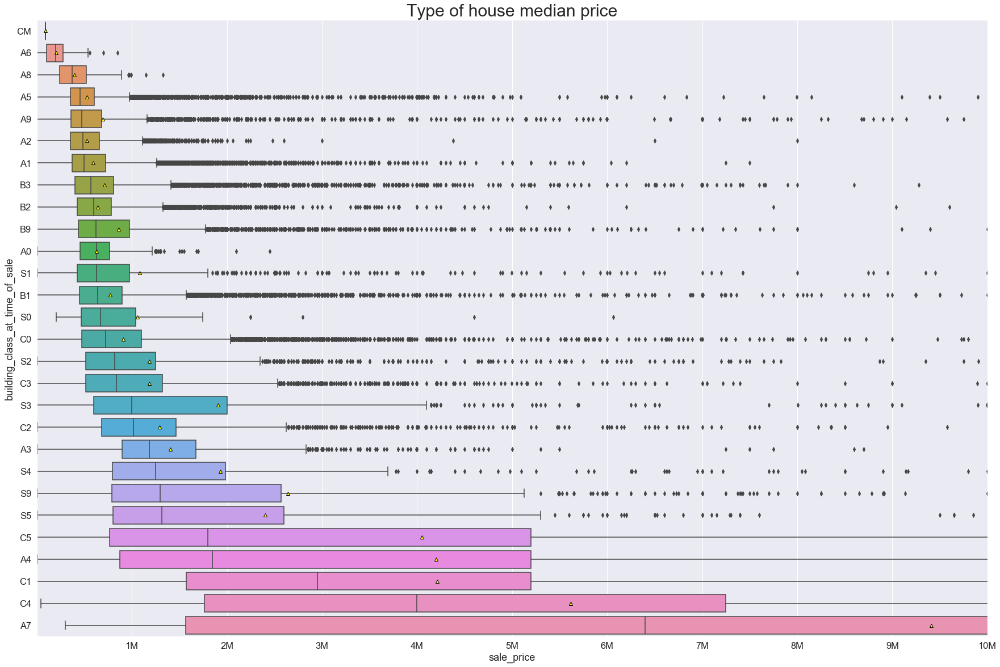

In [169]:
fig = plt.gcf()
fig.set_size_inches(30, 20)

house_types_median_boxplot = sns.boxplot(house.sale_price, house.building_class_at_time_of_sale, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=house_types_sorted.building_class_at_time_of_sale);
house_types_median_boxplot.set(xlim=(0, 10000000));
sns.set(font_scale = 2)
plt.xticks([1000000,2000000,3000000,4000000,5000000,6000000,7000000,8000000,9000000,10000000],['1M','2M','3M','4M','5M','6M','7M','8M','9M','10M']);
plt.title("Type of house median price", size=30);


## 5.3 Condo

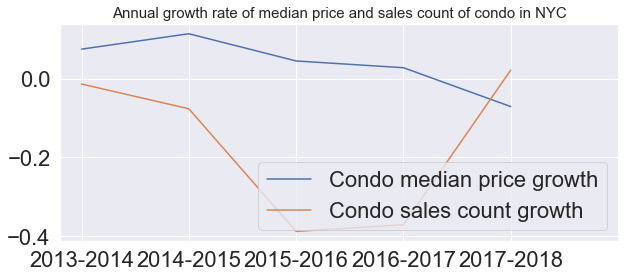

In [170]:
annual_condo_sales_count_growth = []

for i in range(1, len(condo_year_count_no_zero.sale_count)):
    x = ((condo_year_count_no_zero.sale_count.iloc[i] - condo_year_count_no_zero.sale_count.iloc[i-1])/condo_year_count_no_zero.sale_count.iloc[i-1])
    annual_condo_sales_count_growth.append(x)
    
    
annual_condo_mid_price_growth = []

for i in range(1, len(condo_year_price_median.year)):
    x = ((condo_year_price_median.condo_median_price.iloc[i] - condo_year_price_median.condo_median_price.iloc[i-1])/condo_year_price_median.condo_median_price.iloc[i-1])
    annual_condo_mid_price_growth.append(x)

plt.plot(annual_condo_mid_price_growth, label="Condo median price growth")
plt.plot(annual_condo_sales_count_growth, label='Condo sales count growth')

fig = plt.gcf()
fig.set_size_inches(10, 4)
plt.legend(loc=4)
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of condo in NYC", size=15);
plt.show()




In [171]:
condo_borough = condo.groupby(['borough_name','year']).sale_price.median().to_frame('median_sale_price_for_houses_in_each_borough').reset_index()

# condo_borough

In [172]:
annual_condo_median_growth_rate_list = []

for i in range(0, len(condo_borough)):
    if condo_borough.borough_name.iloc[i] == condo_borough.borough_name.iloc[i-1]:
        annual_condo_median_growth_rate_list.append((condo_borough.median_sale_price_for_houses_in_each_borough.iloc[i]\
                                               - condo_borough.median_sale_price_for_houses_in_each_borough.iloc[i-1])\
                                               / condo_borough.median_sale_price_for_houses_in_each_borough.iloc[i-1])
    else:
        annual_condo_median_growth_rate_list.append(0)
        

In [173]:
condo_borough['median_condo_price_annual_growth_borough'] = annual_condo_median_growth_rate_list



The annual median growth rate for condo in each borough seems to fluctuate more compare to annual median growth rate for houes and coop.

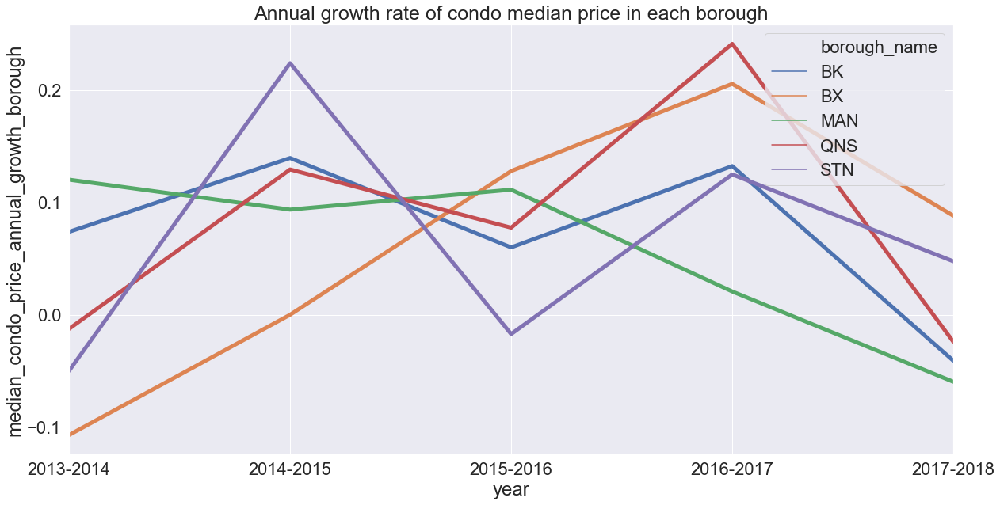

In [174]:
sns.lineplot(condo_borough.year, condo_borough.median_condo_price_annual_growth_borough, hue=condo_borough.borough_name, linewidth=5)

fig = plt.gcf()
fig.set_size_inches(20, 10)

plt.legend()
plt.locator_params(nbins=5)
plt.xlim(2014, 2018)
plt.xticks([2014,2015,2016,2017,2018],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of condo median price in each borough", size=25);
plt.show()



In [175]:
condo_borough_median_growth_rate_avg = []

for i in tqdm(range(0, len(condo_borough))):
    if condo_borough['borough_name'].iloc[i] != condo_borough['borough_name'].iloc[i-1]:
        condo_borough_median_growth_rate_avg.append((condo_borough.median_condo_price_annual_growth_borough.iloc[i+1]\
                                                   + condo_borough.median_condo_price_annual_growth_borough.iloc[i+2]\
                                                   + condo_borough.median_condo_price_annual_growth_borough.iloc[i+3]\
                                                   + condo_borough.median_condo_price_annual_growth_borough.iloc[i+4]\
                                                   + condo_borough.median_condo_price_annual_growth_borough.iloc[i+5])\
                                                   /5)
    else:
        condo_borough_median_growth_rate_avg.append(0)
        
condo_borough['condo_borough_median_growth_rate_avg'] = condo_borough_median_growth_rate_avg

In [176]:
condo_borough_median_growth_rate_avg_extract = condo_borough[condo_borough.condo_borough_median_growth_rate_avg!=0]

In [177]:
# condo_borough

In [178]:
condo_borough_median_growth_rate_avg_ranking = condo_borough_median_growth_rate_avg_extract.drop(['year','median_sale_price_for_houses_in_each_borough','median_condo_price_annual_growth_borough'], axis=1).set_index('borough_name').condo_borough_median_growth_rate_avg.sort_values(ascending=False)
condo_borough_median_growth_rate_avg_ranking

borough_name
QNS    0.082336
BK     0.073004
STN    0.065896
BX     0.062953
MAN    0.057293
Name: condo_borough_median_growth_rate_avg, dtype: float64

The clearer price different is between color pink(R3 -- CONDO; RESIDENTIAL UNIT IN 1-3 STORY BLDG.) and color green(R4 -- CONDO; RESIDENTIAL UNIT IN ELEVATOR BLDG.), which R4 is higher than R3.

In [179]:
# fig = plt.gcf()
# fig.set_size_inches(20, 10)

# condo_plot = sns.scatterplot(condo.sale_date, condo.sale_price, hue=condo.building_class_at_time_of_sale, s=50);
# condo_plot.set_xlim([dt.date(2013, 1, 1), dt.date(2018, 12, 31)]);
# condo_plot.set_ylim(0, 20000000);
# plt.title('Different type of condo and their price trend')

In [180]:
condo_types_sorted = condo.groupby('building_class_at_time_of_sale').sale_price.median().to_frame('condo_types_median_sale_price').sort_values('condo_types_median_sale_price').reset_index()



Condo type highest median price:
* RR	CONDOMINIUM RENTALS
Condo type lowest median price:
* R0	SPECIAL CONDOMINIUM BILLING LOT

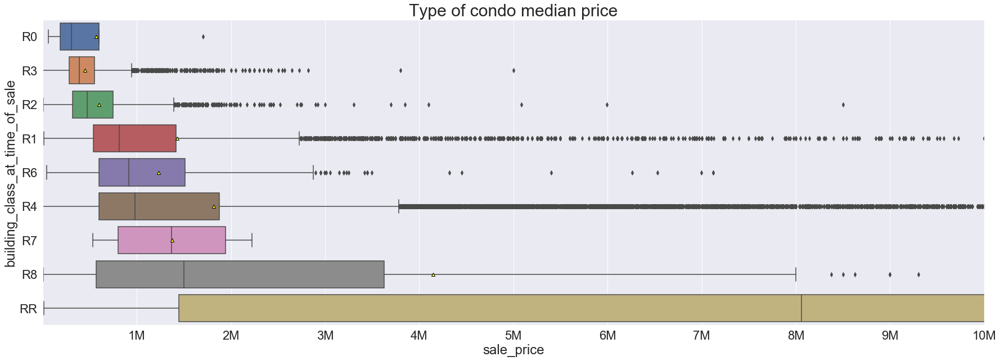

In [181]:
fig = plt.gcf()
fig.set_size_inches(30, 10)

condo_types_median_boxplot = sns.boxplot(condo.sale_price, condo.building_class_at_time_of_sale, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"}, order=condo_types_sorted.building_class_at_time_of_sale);
condo_types_median_boxplot.set(xlim=(0, 10000000));
sns.set(font_scale = 1.5)
plt.xticks([1000000,2000000,3000000,4000000,5000000,6000000,7000000,8000000,9000000,10000000],['1M','2M','3M','4M','5M','6M','7M','8M','9M','10M']);
plt.title("Type of condo median price", size=30);

## 5.4 Coop

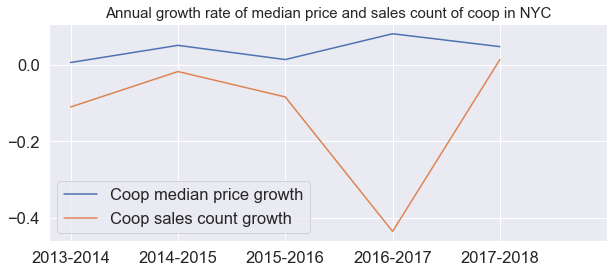

In [182]:
annual_coop_sales_count_growth = []

for i in range(1, len(coop_year_count_no_zero.sale_count)):
    x = ((coop_year_count_no_zero.sale_count.iloc[i] - coop_year_count_no_zero.sale_count.iloc[i-1])/coop_year_count_no_zero.sale_count.iloc[i-1])
    annual_coop_sales_count_growth.append(x)
    
    
annual_coop_mid_price_growth = []

for i in range(1, len(coop_year_price_median.year)):
    x = ((coop_year_price_median.coop_median_price.iloc[i] - coop_year_price_median.coop_median_price.iloc[i-1])/coop_year_price_median.coop_median_price.iloc[i-1])
    annual_coop_mid_price_growth.append(x)

plt.plot(annual_coop_mid_price_growth, label="Coop median price growth")
plt.plot(annual_coop_sales_count_growth, label='Coop sales count growth')

fig = plt.gcf()
fig.set_size_inches(10, 4)
plt.legend(loc=3)
plt.locator_params(nbins=5)
plt.xticks([0,1,2,3,4,5],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of median price and sales count of coop in NYC", size=15);
plt.show()





In [183]:
coop_borough = coop.groupby(['borough_name','year']).sale_price.median().to_frame('median_sale_price_for_coop_in_each_borough').reset_index()


In [184]:
# coop_borough

In [185]:
annual_coop_median_growth_rate_list = []

for i in range(0, len(coop_borough)):
    if coop_borough.borough_name.iloc[i] == coop_borough.borough_name.iloc[i-1]:
        annual_coop_median_growth_rate_list.append((coop_borough.median_sale_price_for_coop_in_each_borough.iloc[i]\
                                               - coop_borough.median_sale_price_for_coop_in_each_borough.iloc[i-1])\
                                               / coop_borough.median_sale_price_for_coop_in_each_borough.iloc[i-1])
    else:
        annual_coop_median_growth_rate_list.append(0)
        

In [186]:
coop_borough['median_coop_price_annual_growth_borough'] = annual_coop_median_growth_rate_list



Annual median price growth rate seems to fluctuate the most for coop in Staten Island compare to coop in  other boroughs.

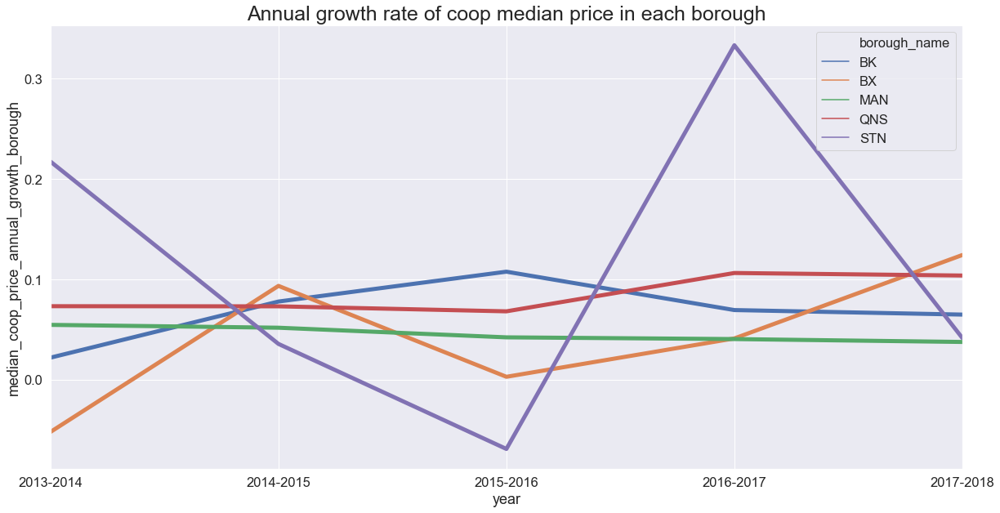

In [187]:
sns.lineplot(coop_borough.year, coop_borough.median_coop_price_annual_growth_borough, hue=coop_borough.borough_name, linewidth=5)

fig = plt.gcf()
fig.set_size_inches(20, 10)

plt.legend()
plt.locator_params(nbins=5)
plt.xlim(2014, 2018)
plt.xticks([2014,2015,2016,2017,2018],['2013-2014', '2014-2015', '2015-2016', '2016-2017', '2017-2018'])
plt.title("Annual growth rate of coop median price in each borough", size=25);
plt.show()



In [188]:
coop_borough_median_growth_rate_avg = []

for i in tqdm(range(0, len(coop_borough))):
    if coop_borough['borough_name'].iloc[i] != coop_borough['borough_name'].iloc[i-1]:
        coop_borough_median_growth_rate_avg.append((coop_borough.median_coop_price_annual_growth_borough.iloc[i+1]\
                                                   + coop_borough.median_coop_price_annual_growth_borough.iloc[i+2]\
                                                   + coop_borough.median_coop_price_annual_growth_borough.iloc[i+3]\
                                                   + coop_borough.median_coop_price_annual_growth_borough.iloc[i+4]\
                                                   + coop_borough.median_coop_price_annual_growth_borough.iloc[i+5])\
                                                   /5)
    else:
        coop_borough_median_growth_rate_avg.append(0)
        
coop_borough['coop_borough_median_growth_rate_avg'] = coop_borough_median_growth_rate_avg

In [189]:
coop_borough_median_growth_rate_avg_extract = coop_borough[coop_borough.coop_borough_median_growth_rate_avg!=0]

In [190]:
coop_borough_median_growth_rate_avg_ranking = coop_borough_median_growth_rate_avg_extract.drop(['year','median_sale_price_for_coop_in_each_borough','median_coop_price_annual_growth_borough'], axis=1).set_index('borough_name').coop_borough_median_growth_rate_avg.sort_values(ascending=False)
coop_borough_median_growth_rate_avg_ranking

borough_name
STN    0.111828
QNS    0.084976
BK     0.068410
MAN    0.045399
BX     0.041996
Name: coop_borough_median_growth_rate_avg, dtype: float64

In [191]:
# fig = plt.gcf()
# fig.set_size_inches(20, 10)

# coop_plot = sns.scatterplot(coop.sale_date, coop.sale_price, hue=coop.building_class_at_time_of_sale, s=50);
# coop_plot.set_xlim([dt.date(2013, 1, 1), dt.date(2018, 12, 31)]);
# coop_plot.set_ylim(0, 20000000);
# plt.title('Different type of coop and their price trend');

Coop types median price rank:
* C8	WALK-UP CO-OP; CONVERSION FROM LOFT/WAREHOUSE
* D0	ELEVATOR CO-OP; CONVERSION FROM LOFT/WAREHOUSE
* D4	ELEVATOR COOPERATIVE
* C6	WALK-UP COOPERATIVE

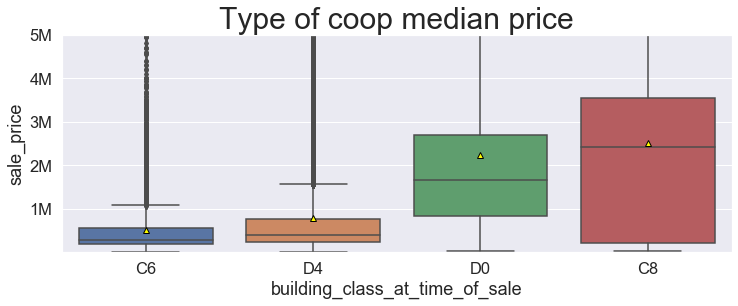

In [192]:
conop_types_median_boxplot = sns.boxplot(coop.building_class_at_time_of_sale, coop.sale_price, showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"})
conop_types_median_boxplot.set(ylim=(0, 5000000));
sns.set(font_scale = 1.5)
plt.yticks([1000000,2000000,3000000,4000000,5000000],['1M','2M','3M','4M','5M']);
plt.title("Type of coop median price", size=30);

little knowledge about loft in NYC:

In the strictest sense, a loft is an apartment in a building that was formerly industrial, and as such, comes with a certain set of particular aesthetic and architectural characteristics. "A true loft is in a building that was built for industrial purposes," explains Douglas Elliman broker Lucy Aceto. "And industrial building standards are different than residential, so you tend to have higher ceilings, larger windows, thicker walls and floors, and the proportions are very open—these weren't divided up like traditional apartments."

# 6 Units & Sale_price:

Already cleaned the data, total units = residential units + commercial units
* Residential Units:
    * The number of residential units at the listed property.
* Commercial Units:
    * The number of commercial units at the listed property.
* Total Units:
    * The total number of units at the listed property. 

At the first glance, we can see there exist 2 buildings with more than 8000 units at the upper left of the plot.

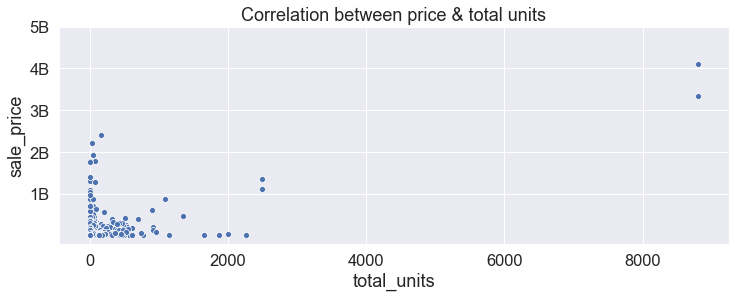

In [193]:
sns.scatterplot(nyc14.total_units, nyc14.sale_price);
plt.yticks([1000000000,2000000000,3000000000,4000000000,5000000000],['1B','2B','3B','4B','5B']);
plt.title('Correlation between price & total units');

From the plot below we can see that there do not seem to exist a strong correlation between total units and sale price.

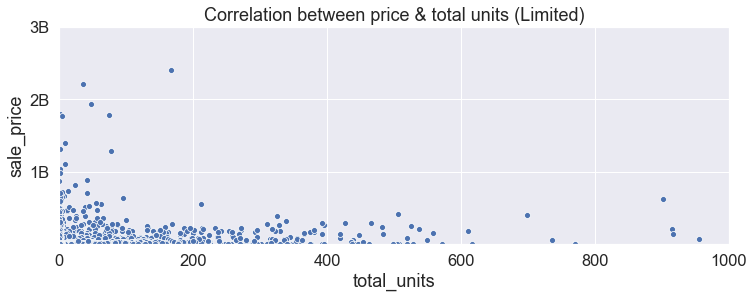

In [194]:
total_units_sale_price_limited = sns.scatterplot(nyc14.total_units, nyc14.sale_price);
total_units_sale_price_limited.set_xlim(0, 1000)
total_units_sale_price_limited.set_ylim(0, 3000000000)
plt.yticks([1000000000,2000000000,3000000000],['1B','2B','3B']);
plt.title('Correlation between price & total units (Limited)');

Seperating the data into 3 type and see if I can find some pattern of different constitution of total units.

In [195]:
more_residential = nyc14[nyc14.residential_units > nyc14.commercial_units]

In [196]:
more_commercial = nyc14[nyc14.residential_units < nyc14.commercial_units]

In [197]:
res_equal_com = nyc14[nyc14.residential_units == nyc14.commercial_units]

In [198]:
print(len(more_residential))
print(len(more_commercial))
print(len(res_equal_com))

233521
13076
106341


From the plot below we can see a strong correlation between total units and sale price after extracting the properties mainly for residential purposes.

Correlation: 0.8955379492178825
Correlation P-value: 0.0


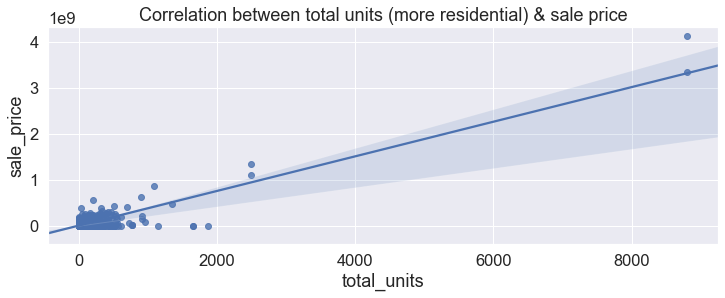

In [199]:
sns.regplot(more_residential.total_units, more_residential.sale_price);
plt.title('Correlation between total units (more residential) & sale price');
print('Correlation: ' + str(stats.pearsonr(more_residential.total_units, more_residential.sale_price)[0]))
print('Correlation P-value: ' + str(stats.pearsonr(more_residential.total_units, more_residential.sale_price)[1]))

From the two plot below, the correlation between total units and sale price seemed weak, this means that for properties with higher or equal to 50% of commercial units, total units do not seeemed to affect sale price strongly.

Correlation: 0.10119907992781324
Correlation P-value: 4.080819589610787e-31


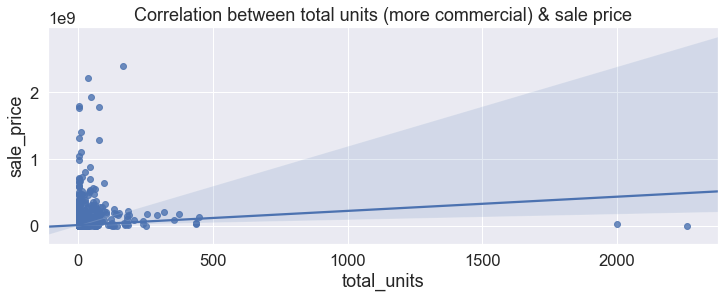

In [200]:
sns.regplot(more_commercial.total_units, more_commercial.sale_price);
plt.title('Correlation between total units (more commercial) & sale price');
print('Correlation: ' + str(stats.pearsonr(more_commercial.total_units, more_commercial.sale_price)[0]))
print('Correlation P-value: ' + str(stats.pearsonr(more_commercial.total_units, more_commercial.sale_price)[1]))

Correlation: 0.01972485171995168
Correlation P-value: 1.2525963668181007e-10


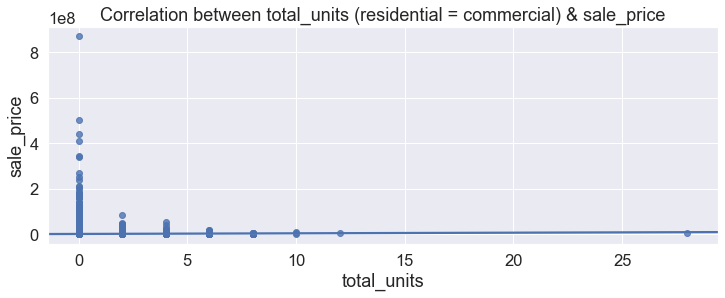

In [201]:
sns.regplot(res_equal_com.total_units, res_equal_com.sale_price);
plt.title('Correlation between total_units (residential = commercial) & sale_price');
print('Correlation: ' + str(stats.pearsonr(res_equal_com.total_units, res_equal_com.sale_price)[0]))
print('Correlation P-value: ' + str(stats.pearsonr(res_equal_com.total_units, res_equal_com.sale_price)[1]))

In [202]:
nyc14.columns

Index(['borough', 'neighborhood', 'building_class_category',
       'tax_class_at_present', 'block', 'lot', 'building_class_at_present',
       'address', 'apartment_number', 'zip_code', 'residential_units',
       'commercial_units', 'total_units', 'land_sqft', 'gross_sqft',
       'year_built', 'tax_class_at_time_of_sale',
       'building_class_at_time_of_sale', 'sale_price', 'sale_date', 'month',
       'year', 'borough_name', 'house_type'],
      dtype='object')

# 7. SQFT & sale_price
After some anlysis, since there are nearly 160000 rows with value 0, it is not fair to interpret things from these 2 columns.

To avoid bias, I have set the x-axis and y-axis using the same scale.

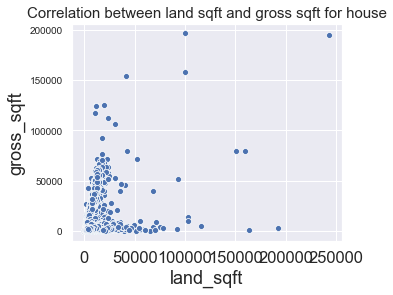

In [205]:
sns.scatterplot(house.land_sqft, house.gross_sqft);
sns.set(font_scale = 1)
plt.yticks(ticks=np.arange(0, 250000, 50000).tolist(), label=np.arange(0, 250000, 50000), size=10);
plt.gca().set_aspect('equal', adjustable='box')
plt.title('Correlation between land sqft and gross sqft for house', size=15);

When I first plot out the gross sqft vs land sqft for condo in NYC, I realized there exist a right angle in the plot, I add a hue to discover what type of condo right angle's sides belong to.

* Condo type which line along x-axis:
    * R3 CONDO; RESIDENTIAL UNIT IN 1-3 STORY BLDG., line lie along x-axis means that the gross sqft data is missing or = 0. 
* Condo type which line along y-axis:
    * RR CONDO RENTALS, for points which are parallel to y-axis, these points indicate that they have 0 or missing land sqft.

By doing the analysis to find out the reason for this phanomenon, I realized this is due to lack of data, we cannot really say much when half of the data are missing.

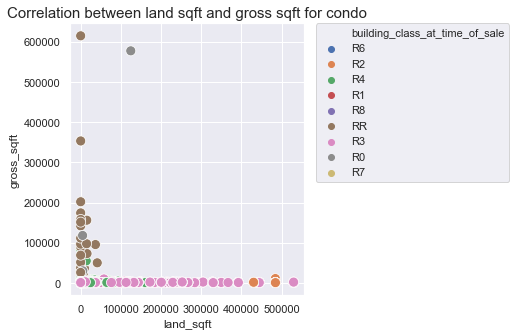

In [206]:
fig = plt.gcf()
fig.set_size_inches(5, 5)
sns.scatterplot(condo.land_sqft, condo.gross_sqft, hue=condo.building_class_at_time_of_sale, s=100);
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.gca().set_aspect('equal', adjustable='box')
sns.set(font_scale = 1)
plt.title('Correlation between land sqft and gross sqft for condo', size=15);

It seeems normal for the coop plot to have gross sqft generally greater than land sqft, since they are usually building with more than 1 story.

No handles with labels found to put in legend.


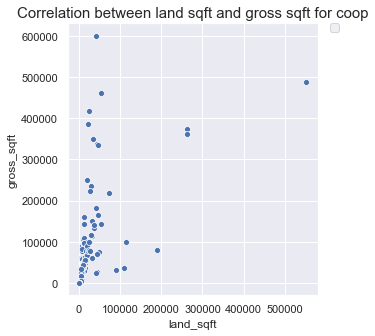

In [207]:
fig = plt.gcf()
fig.set_size_inches(5, 5)
sns.scatterplot(coop.land_sqft, coop.gross_sqft);
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.gca().set_aspect('equal', adjustable='box')
plt.title('Correlation between land sqft and gross sqft for coop', size=15);

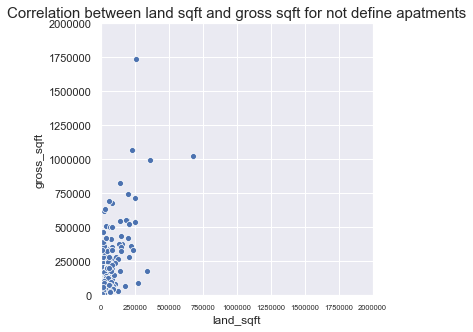

In [208]:
fig = plt.gcf()
fig.set_size_inches(5, 5)
plt.gca().set_aspect('equal', adjustable='box')
sns.scatterplot(apartment_not_define.land_sqft, apartment_not_define.gross_sqft);
plt.xticks(ticks=np.arange(0, 25000000, 250000).tolist(), label=np.arange(0, 2500000, 250000), size=7.5);
plt.xlim(0, 2000000)
plt.ylim(0, 2000000)
plt.title('Correlation between land sqft and gross sqft for not define apatments', size=15);

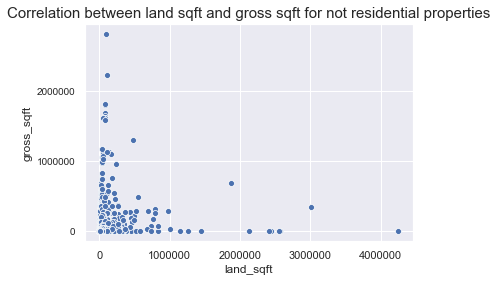

In [209]:
sns.scatterplot(others.land_sqft, others.gross_sqft);
plt.gca().set_aspect('equal', adjustable='box')
plt.yticks(ticks=np.arange(0, 3000000, 1000000).tolist(), label=np.arange(0, 3000000, 1000000), size=10);
plt.title('Correlation between land sqft and gross sqft for not residential properties', size=15);

In [210]:
# nyc14.land_sqft.value_counts()

In [211]:
# nyc14.gross_sqft.value_counts()

Thought by inter-filling gross_sqft and land_sqft, I can reduce the amount of zero in both of these columns, but the effect is not significant, decide to maintain the original data.

In [212]:
# for i in tqdm(range(0, len(nyc14))):
#     if ((nyc14.gross_sqft.iloc[i] == 0) & (nyc14.land_sqft.iloc[i] != 0)):
#         nyc14.gross_sqft.iloc[i] = nyc14.land_sqft.iloc[i]
#     elif ((nyc14.land_sqft.iloc[i] == 0) & (nyc14.gross_sqft.iloc[i] != 0)):
#         nyc14.land_sqft.iloc[i] = nyc14.gross_sqft.iloc[i]

In [213]:
# nyc14.land_sqft.value_counts()

In [214]:
nyc14['price_per_land_sqft'] = nyc14.sale_price / nyc14.land_sqft

In [215]:
nyc14['price_per_gross_sqft'] = nyc14.sale_price / nyc14.gross_sqft

In [216]:
price_per_land_sqft_filtered = nyc14[nyc14['price_per_land_sqft']!=np.inf]

In [217]:
price_per_gross_sqft_filtered = nyc14[nyc14['price_per_gross_sqft']!=np.inf]

In [244]:
house_type_extract = nyc14[['house_type', 'price_per_land_sqft', 'price_per_gross_sqft']]

In [249]:
house_type_sqft_extract_melt = pd.melt(house_type_extract,id_vars=['house_type'], var_name='land_or_gross', value_name='price_per_sqft')
# house_type_sqft_extract_melt


In [250]:
house_type_extract_melt_filter = house_type_sqft_extract_melt[house_type_sqft_extract_melt.price_per_sqft!=np.inf]

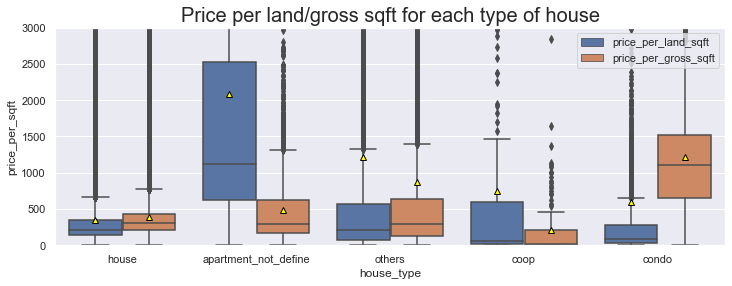

In [251]:
house_type_price_sqft_boxplot = sns.boxplot(house_type_extract_melt_filter.house_type, house_type_extract_melt_filter.price_per_sqft, hue=house_type_extract_melt_filter.land_or_gross, showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"});
house_type_price_sqft_boxplot.set_ylim(0, 3000);
plt.legend(loc=1);
plt.title('Price per land/gross sqft for each type of house', size=20); 

It is not surprising that for apartment type of buildings land sqft is more expensive, since the ususally have higher gross sqft which as denominator, which will reduce price per gross sqft. The only abnormal median price here is the price per gross sqft of condo. Which from the plot above are caused by those thats lying closed to x-axis.

By printing out the data for these with high price per gross sqft price, I realized that majority of them have the land_sqft missed, which is the reasomn that cause the abnormal high median of price_per_gross_sqft compare to price_per_land_sqft, since per_land_sqft = 0 get filtered out, after plotting out plot, which I keep all the inf value for price_per_sqfts, the abnormality is gone, but from the plot is hard to interpret things. Filling the 0 value to each other will not be too helpful, since there will still have nearly half of the data thats with 0 in both column.

In [203]:
# price_per_gross_sqft_filtered[price_per_gross_sqft_filtered.house_type=='condo'].sort_values('price_per_gross_sqft', ascending = False).head(50)

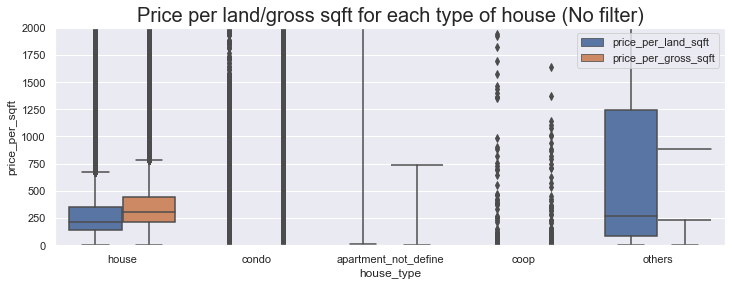

In [254]:
house_type_price_sqft_boxplot_o = sns.boxplot(house_type_sqft_extract_melt.house_type, house_type_sqft_extract_melt.price_per_sqft, hue=house_type_sqft_extract_melt.land_or_gross, showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"});
house_type_price_sqft_boxplot_o.set_ylim(0, 2000);
plt.legend(loc=1);
plt.title('Price per land/gross sqft for each type of house (No filter)', size=20);

# 8. Year_built & sale_price

## 8.1 Year_built & sale_price

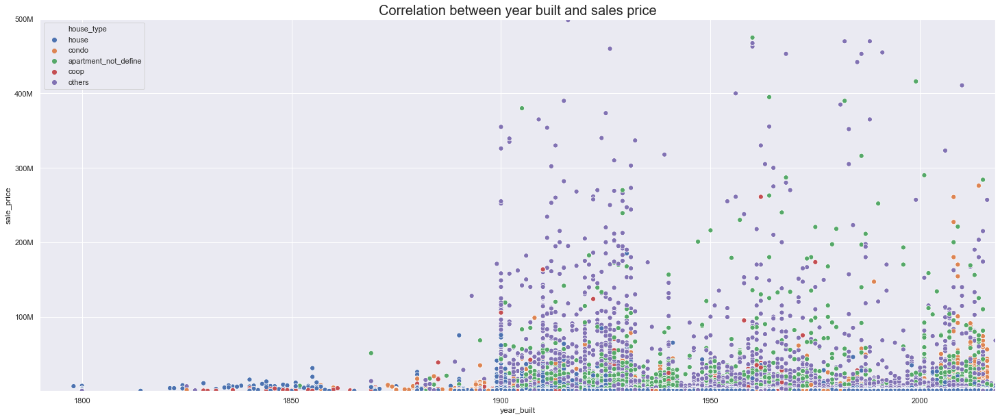

In [227]:
fig = plt.gcf()
fig.set_size_inches(25, 10)

year_price_type = sns.scatterplot(nyc14.year_built, nyc14.sale_price, hue=nyc14.house_type, s=50);
year_price_type.set_xlim(1790, 2018);
year_price_type.set_ylim(0, 500000000);
plt.yticks([100000000,200000000,300000000,400000000,500000000],['100M','200M','300M','400M','500M']);
plt.title("Correlation between year built and sales price", size=20);

In [228]:
print('Correlation: ' + str(stats.pearsonr(nyc14.year_built, nyc14.sale_price)[0]))
print('Correlation P-value: ' + str(stats.pearsonr(nyc14.year_built, nyc14.sale_price)[1]))

Correlation: -0.0034922052226091576
Correlation P-value: 0.03801725072448183


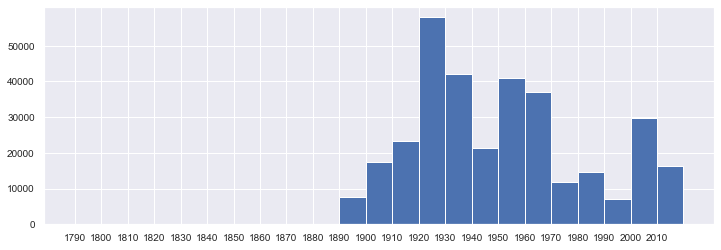

In [272]:
year_barplot = plt.hist(nyc14.year_built,range=(1790, 2020), bins=23);
plt.xticks(ticks=np.arange(1790, 2020, 10).tolist(), label=np.arange(1790, 2020, 10), size=10);
plt.yticks(ticks=np.arange(0, 60000, 10000).tolist(), label=np.arange(0, 60000, 10000), size=10);


In [230]:
nyc15 = pd.read_csv('data/NYC/nyc15.csv', index_col=False)

In [231]:
# nyc15 is the dataset with 0 replaced by NaN
nyc15.year_built.mean()

1949.2198167888685

In [232]:
nyc14['year_built_decade'] = 0

In [3]:
stop here

SyntaxError: invalid syntax (<ipython-input-3-a96ba3aab008>, line 1)

This following function is to categorized years into decades to see if the price will be affect by the years built.

In [233]:
for i in tqdm(range(0, len(nyc15))):
    for j in range(1790, 2020, 10):
        if j <= nyc15.year_built.iloc[i] < j+10:
            nyc14.year_built_decade.iloc[i] = j

/Users/justin/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Though houses built in the 1800s seems to have higher median price but by plotting out the histogram, we can see that this is due to lack of amount of houses during 19 century. Hence, it will make more sense to only look at houses that are built in 20 & 21 centuries.

From the plot below I realized that house built in 1900s and house built in 2010s seems to have the highest median price compare to house built in other decades. After apply Mann_whitney U test, house built in 2010s have higher price compare to house built in 1900s, however house built in 1900s in general have higher price compare to house built in 2000s. 

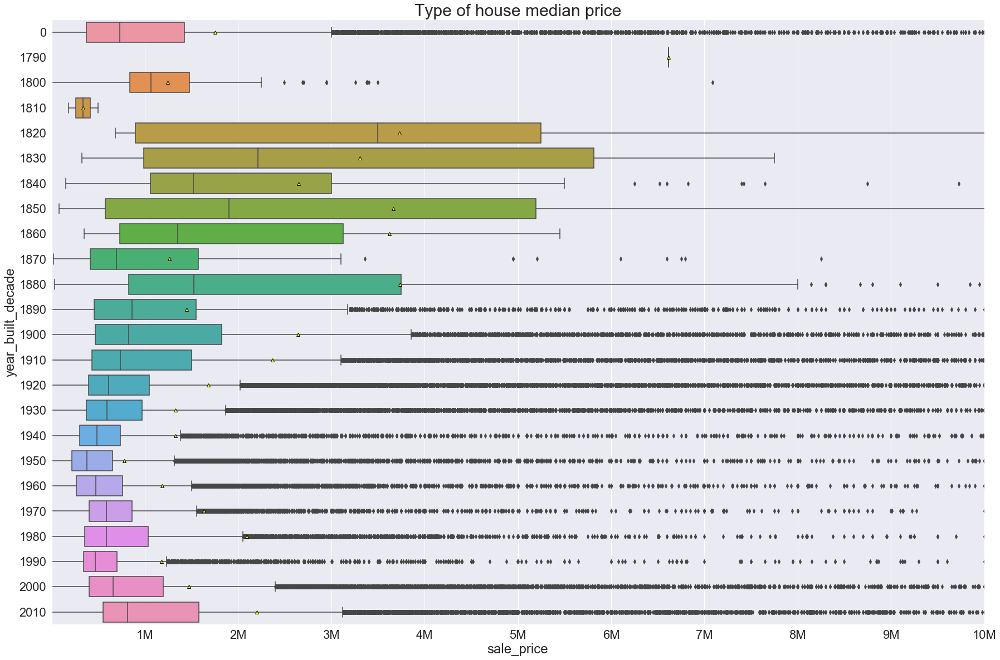

In [242]:
fig = plt.gcf()
fig.set_size_inches(30, 20)

decade_price_median_boxplot = sns.boxplot(nyc14.sale_price, nyc14.year_built_decade, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"});
decade_price_median_boxplot.set(xlim=(0, 10000000));
# decade_price_median_boxplot.set(ylim=(1900, 2010));
sns.set(font_scale = 2)
plt.xticks([1000000,2000000,3000000,4000000,5000000,6000000,7000000,8000000,9000000,10000000],['1M','2M','3M','4M','5M','6M','7M','8M','9M','10M']);
plt.title("Type of house median price", size=30);


In [236]:
hypo_1side(nyc14[nyc14.year_built_decade == 1900].sale_price,\
           nyc14[nyc14.year_built_decade == 2010].sale_price)

'P-value: 0.000002, y houes price is higher than x'

In [237]:
hypo_1side(nyc14[nyc14.year_built_decade == 1900].sale_price,\
           nyc14[nyc14.year_built_decade == 2000].sale_price)

'P-value: 1.000000, x house price is higher than y'

Plotting out the graph for properties only for residential use, to exmine if there exist any differnent from entire property market. From the graph below, it do not seemed that differnet from the graph above.

In [256]:
residential_year_built = nyc14[nyc14.house_type != 'others']

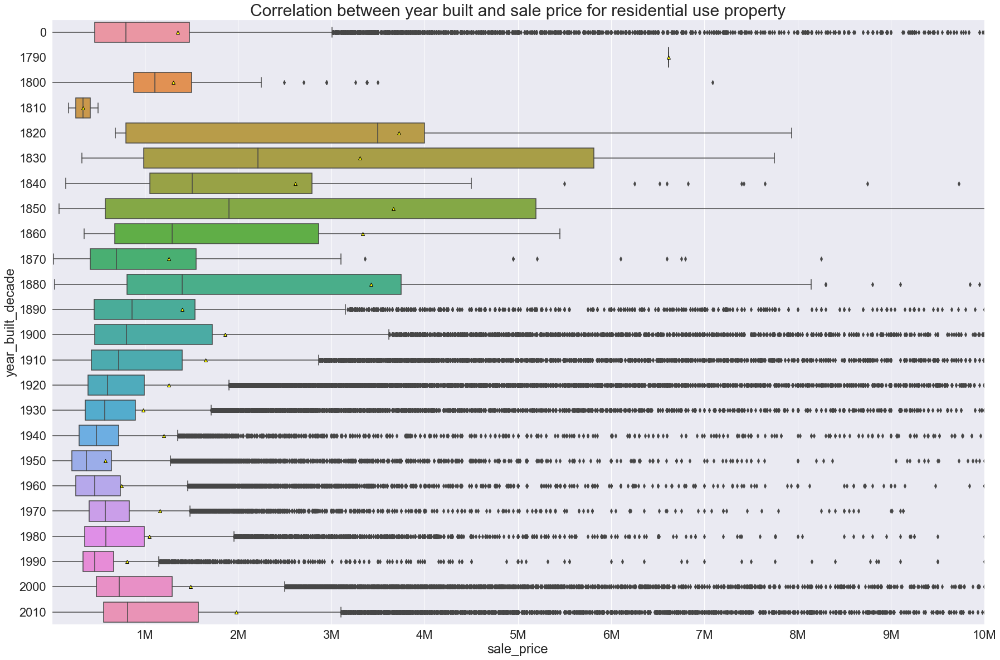

In [239]:
fig = plt.gcf()
fig.set_size_inches(30, 20)

decade_price_median_boxplot = sns.boxplot(residential_year_built.sale_price, residential_year_built.year_built_decade, orient='h', showmeans=True, meanprops={"markerfacecolor":"yellow", "markeredgecolor":"black"});
decade_price_median_boxplot.set(xlim=(0, 10000000));
sns.set(font_scale = 2)
plt.xticks([1000000,2000000,3000000,4000000,5000000,6000000,7000000,8000000,9000000,10000000],['1M','2M','3M','4M','5M','6M','7M','8M','9M','10M']);
plt.title("Correlation between year built and sale price for residential use property", size=30);



## 8.2 Year_built & boroughs
### 8.2.1 Year_built & boroughs & sales_counts(with price, no price trade not include in here)

In [266]:
# fig = plt.gcf()
# fig.set_size_inches(20, 15)

# year_built_borough_barplot = plt.hist([man_c.year_built, bk_c.year_built, qns_c.year_built\
#                          ,bx_c.year_built, stn_c.year_built]\
#                         ,range=(1890, 2020), bins=13, stacked=True);
# plt.xticks(ticks=np.arange(1890, 2020, 10).tolist(), label=np.arange(1790, 2020, 10), size=10);
# plt.yticks(ticks=np.arange(0, 60000, 10000).tolist(), label=np.arange(0, 60000, 10000), size=10);
# plt.legend(['MAN', 'BK', 'QNS', 'BX', 'STN']);
# plt.title('Amount of properties built in each decade in every boroughs in NYC', size=20);



From the plot below we can see that houses built in the 1920s are the hottest in the market for each boough except staten island, on the other hand, houses built in the 2000s is the least popular. There seems to have cycles of popularity of the house built in differnt decades (a phanomenom worth reseraching).

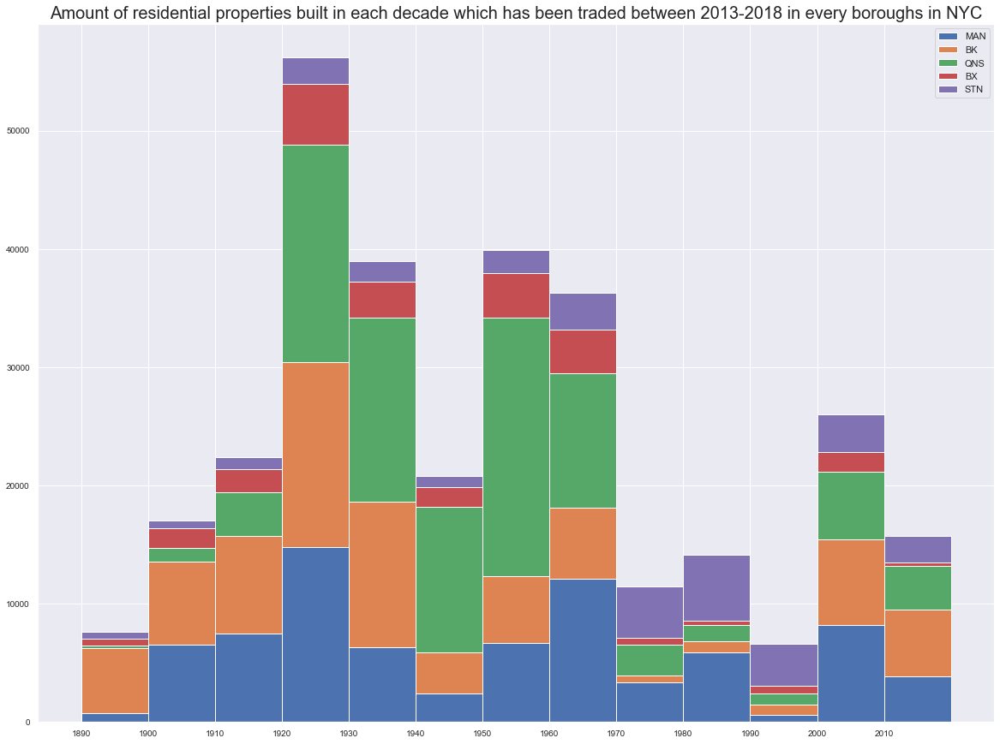

In [264]:
fig = plt.gcf()
fig.set_size_inches(20, 15)

year_built_residential_borough_barplot = plt.hist([residential_year_built[residential_year_built.borough_name=='MAN'].year_built,\
                                                   residential_year_built[residential_year_built.borough_name=='BK'].year_built,\
                                                   residential_year_built[residential_year_built.borough_name=='QNS'].year_built,\
                                                   residential_year_built[residential_year_built.borough_name=='BX'].year_built,\
                                                   residential_year_built[residential_year_built.borough_name=='STN'].year_built]\
                                                    ,range=(1890, 2020), bins=13, stacked=True);
plt.xticks(ticks=np.arange(1890, 2020, 10).tolist(), label=np.arange(1790, 2020, 10), size=10);
plt.yticks(ticks=np.arange(0, 60000, 10000).tolist(), label=np.arange(0, 60000, 10000), size=10);
plt.legend(['MAN', 'BK', 'QNS', 'BX', 'STN']);
plt.title('Amount of residential properties built in each decade which has been traded between 2013-2018 in every boroughs in NYC', size=20);




Check point! To avoid not enough CPU, save all the generated column into new data frame nyc16.

In [240]:
nyc14.to_csv('data/NYC/nyc16.csv', index=False)

In [268]:
nyc16 = pd.read_csv('data/NYC/nyc16.csv', index_col=False)

In [245]:
# nyc16.info()

### 8.2.2 Year_built, borough & sales_price

In [272]:
residential_year_built = nyc16[nyc16.house_type != 'others']

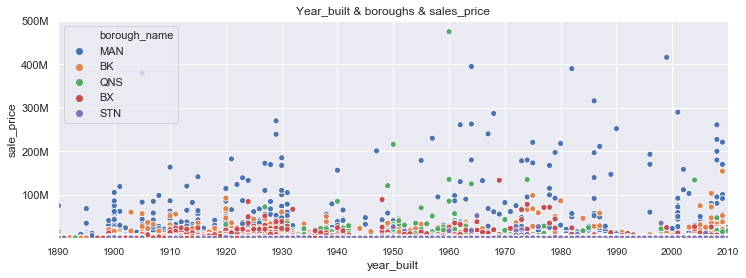

In [331]:
fig = plt.gcf()
fig.set_size_inches(20, 15)

sns.scatterplot(residential_year_built.year_built, residential_year_built.sale_price, hue=residential_year_built.borough_name);
plt.xticks(ticks=np.arange(1890, 2020, 10).tolist(), label=np.arange(1890, 2020, 10), size=10);
plt.xlim(1890, 2010);
plt.ylim(0, 500000000)
plt.yticks([100000000,200000000,300000000,400000000,500000000],['100M','200M','300M','400M','500M']);
plt.title('Year_built & boroughs & sales_price', size=15);

In [283]:
nyc16.columns

Index(['borough', 'neighborhood', 'building_class_category',
       'tax_class_at_present', 'block', 'lot', 'building_class_at_present',
       'address', 'apartment_number', 'zip_code', 'residential_units',
       'commercial_units', 'total_units', 'land_sqft', 'gross_sqft',
       'year_built', 'tax_class_at_time_of_sale',
       'building_class_at_time_of_sale', 'sale_price', 'sale_date', 'month',
       'year', 'borough_name', 'house_type', 'price_per_land_sqft',
       'price_per_gross_sqft', 'year_built_decade'],
      dtype='object')

### 8.2.3 Year_built, house_type & sales_counts

Coops, which are built before year 1970s are very popular compare to condos built before 1970s in 2013-2018 house market. On the other hand, condos built after 1980s seems to out popular coop for the house market.

To research more: is there less condo before year 1980s?

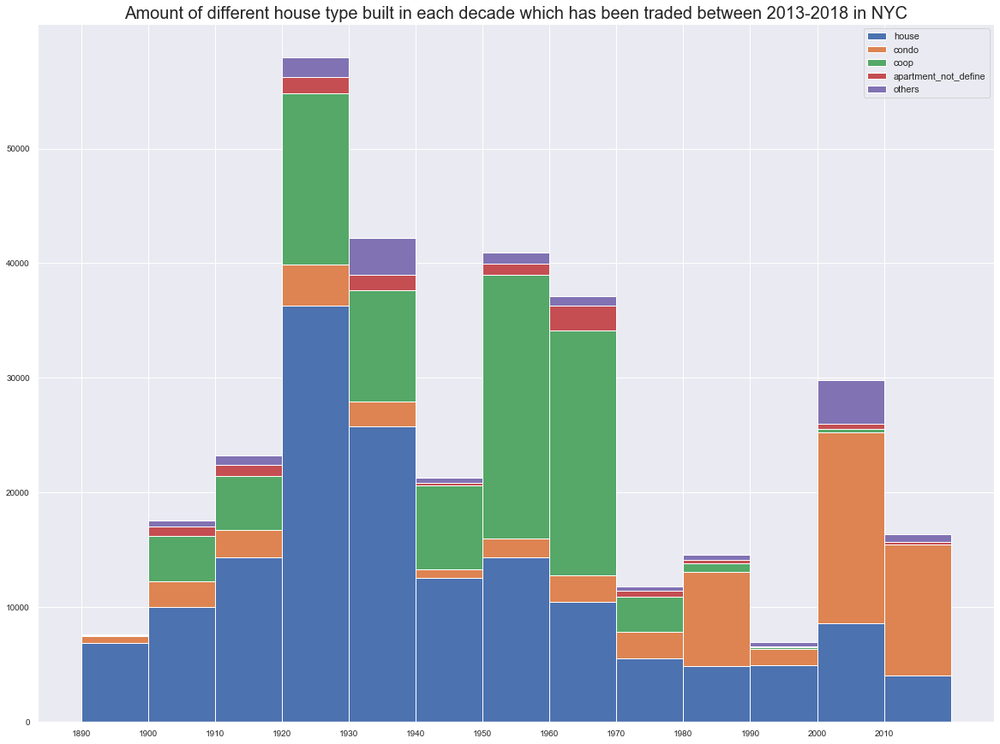

In [290]:
fig = plt.gcf()
fig.set_size_inches(20, 15)

year_built_house_type_barplot = plt.hist([nyc14[nyc14.house_type=='house'].year_built,\
                                          nyc14[nyc14.house_type=='condo'].year_built,\
                                          nyc14[nyc14.house_type=='coop'].year_built,\
                                          nyc14[nyc14.house_type=='apartment_not_define'].year_built,\
                                          nyc14[nyc14.house_type=='others'].year_built], \
                                          range=(1890, 2020), bins=13, stacked=True);
plt.xticks(ticks=np.arange(1890, 2020, 10).tolist(), label=np.arange(1890, 2020, 10), size=10);
plt.yticks(ticks=np.arange(0, 60000, 10000).tolist(), label=np.arange(0, 60000, 10000), size=10);
plt.legend(['house', 'condo', 'coop', 'apartment_not_define', 'others']);
plt.title('Amount of different house type built in each decade which has been traded between 2013-2018 in NYC', size=20);




# 9. Lot, block & sale_price

* Block:
A Tax Block is a sub-division of the borough on which real properties are located.
The Department of Finance uses a Borough-Block-Lot classification to label all real
property in the City. “Whereas” addresses describe the street location of a property, the
block and lot distinguishes one unit of real property from another, such as the different
condominiums in a single building. Also, block and lots are not subject to name changes
based on which side of the parcel the building puts its entrance on.

* Lot:
A Tax Lot is a subdivision of a Tax Block and represents the property unique location.

In [315]:
lot_block = nyc16.groupby(['lot','block']).sale_price.count().to_frame().reset_index()

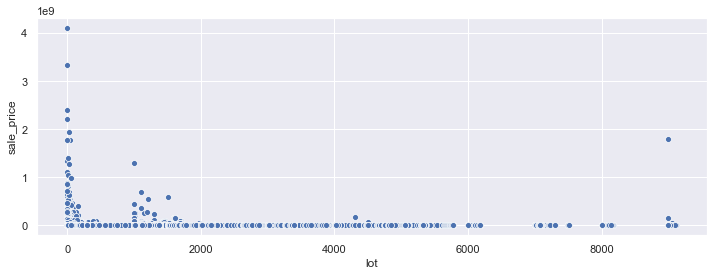

In [319]:
sns.scatterplot(nyc16.lot, nyc16.sale_price);

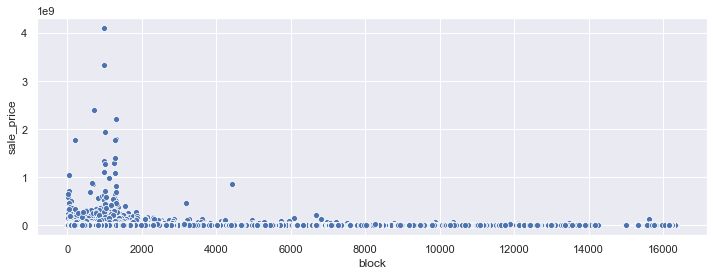

In [321]:
sns.scatterplot(nyc16.block, nyc16.sale_price);

In [ ]:
fig = plt.gcf()
fig.set_size_inches(10, 20)
sns.scatterplot(nyc16.lot, nyc16.block, hue=(nyc16.sale_price>10000000));
plt.gca().set_aspect('equal', adjustable='box');



# 10. Mix & Match

# 11. Experiment: Forex exchange(USD), net immigrants & sale_price

# House price vs US currency

# House price vs US net immigration

## 4.6 Growth as whole 

In [ ]:
borough(nyc_ts_year_avg)

checked the house price per borough per year, if skewed use median, check skewness use stat!!

In [ ]:
borough_year_avg_plot = px.line(nyc_ts_year_avg, 'year', 'sale_price', color='borough');
borough_year_avg_plot

In [ ]:
nyc_ts_year_median = nyc14.groupby(['year', 'borough']).sale_price.median().to_frame().reset_index()


## Median is closer to the actual value

In [ ]:
borough_year_median_plot = px.line(nyc_ts_year_median, 'year', 'sale_price', color='borough');

borough_year_median_plot

In [ ]:
nyc_ts_year_avg.borough.unique()

In [ ]:
xlabels = ({'1':'MAN', '2':'BX', '3':'BK', '4':'QNS', '5':'STN'})

In [ ]:
man_ts = man.groupby('sale_date').sale_price.mean().to_frame().reset_index()
#man_ts.head()

In [ ]:
px.line(man_ts, "sale_date", "sale_price")

In [ ]:
# Add building_class_category feature to see if different building type will have a trend

In [ ]:
man_tax_1 = man[man.tax_class_at_time_of_sale==1]
qns_tax_1 = qns[qns.tax_class_at_time_of_sale==1]


In [ ]:
ts_man_1 = man_tax_1.groupby('sale_date').sale_price.mean().to_frame().reset_index()
ts_qns_1 = qns_tax_1.groupby('sale_date').sale_price.median().to_frame().reset_index()

In [ ]:
px.line(ts_man_1, "sale_date", "sale_price")

In [ ]:
px.line(ts_qns_1, "sale_date", "sale_price")

In [ ]:
nyc_tax_1 = nyc14[nyc14.tax_class_at_time_of_sale==1]
ts_nyc_1 = nyc_tax_1.groupby('sale_date').sale_price.mean().to_frame().reset_index()

In [ ]:
px.line(ts_nyc_1, "sale_date", "sale_price")

In [ ]:
sns.distplot(ts_nyc_1.sale_price)
normality_test(ts_nyc_1.sale_price)

In [ ]:
ts_dwelling_1 = nyc14[nyc14.building_class_category=='01_one_family_dwellings']
ts_dwelling_1 = ts_dwelling_1.groupby('sale_date').sale_price.mean().to_frame().reset_index()
px.line(ts_dwelling_1, "sale_date", "sale_price")

In [ ]:
nyc14.building_class_category.value_counts()

In [ ]:
sns.lineplot(ts_dwelling_1.sale_date, ts_qns_1.sale_price)